## This notebook implements the GuidedNet method on the Botswana Hyperspectral Image

Imports

In [1]:
import numpy as np
import scipy.io as sio
import time
import random
import cv2
import math
import pynvml

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

import io as iot
import sys
from spectral import *
from tqdm import trange
from argparse import Namespace
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from scipy.special import gamma, kv, erf
from config import *
from collections import OrderedDict
from tqdm import tqdm
import psutil
import tensorflow as tf
from tensorflow.python.framework.convert_to_constants import convert_variables_to_constants_v2

In [2]:
def set_random_seed(seed=42):
    """
    Sets the random seed for reproducibility in TensorFlow, NumPy, and Python.
    Also sets TF deterministic ops.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

    # Optional: Force deterministic operations
    try:
        tf.config.experimental.enable_op_determinism()
    except AttributeError:
        # Older TF version fallback
        os.environ['TF_DETERMINISTIC_OPS'] = '1'
        
set_random_seed(42)

Helper Functions

In [3]:
# Defining each PSF

kernel_size = 7
sigma = 3.40

def gaussian_psf(sigma, psf_size):
    """Generate a Gaussian PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    psf = np.exp(-(X**2 + Y**2) / (2 * sigma**2))
    psf = psf / psf.sum()
    return psf
gaus_psf = gaussian_psf(sigma, kernel_size)

def kolmogorov_psf(sigma, psf_size):
    """Generate a Kolmogorov PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.exp(-(r / sigma)**(5/3))
    psf = psf / psf.sum()
    return psf
kol_psf = kolmogorov_psf(sigma, kernel_size)

def airy_psf(sigma, psf_size):
    """Generate an Airy PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    z = (2.33811 * r) / sigma
    psf = (2 * kv(1, z) / z)**2
    psf[r == 0] = 1
    psf = psf / psf.sum()
    return psf
air_psf = airy_psf(sigma, kernel_size)

def moffat_psf(sigma, psf_size, beta=3.5):
    """Generate a Moffat PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = (1 + (r / sigma)**2)**(-beta)
    psf = psf / psf.sum()
    return psf
mof_psf = moffat_psf(sigma, kernel_size)

def sinc_psf(sigma, psf_size):
    """Generate a Sinc PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.sinc(r / sigma)
    psf = psf / psf.sum()
    return psf
sinc_psf = sinc_psf(sigma, kernel_size)

def lorentzian_squared_psf(sigma, psf_size):
    """Generate a Lorentzian Squared PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = 1 / (1 + (r / sigma)**4)
    psf = psf / psf.sum()
    return psf
lor_sq_psf = lorentzian_squared_psf(sigma, kernel_size)

def hermite_psf(sigma, psf_size, n=1):
    """Generate a Hermite PSF."""
    from numpy.polynomial.hermite import hermval
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.exp(-r**2 / (2 * sigma**2)) * hermval(r / sigma, [0]*n + [1])
    psf = psf / psf.sum()
    return psf
her_psf = hermite_psf(sigma, kernel_size)

def parabolic_psf(sigma, psf_size):
    """Generate a Parabolic PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    r = np.sqrt(X**2 + Y**2)
    psf = np.maximum(0, 1 - (r / sigma)**2)
    psf = psf / psf.sum()
    return psf
par_psf = parabolic_psf(sigma, kernel_size)

def gabor_psf(sigma, psf_size, theta=0, lambd=1, gamma=0.5, psi=0):
    """Generate a Gabor PSF."""
    x = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    y = np.linspace(-psf_size, psf_size, 2*psf_size+1)
    X, Y = np.meshgrid(x, y)
    x_theta = X * np.cos(theta) + Y * np.sin(theta)
    y_theta = -X * np.sin(theta) + Y * np.cos(theta)
    psf = np.exp(-0.5 * (x_theta**2 + gamma**2 * y_theta**2) / sigma**2) * np.cos(2 * np.pi * x_theta / lambd + psi)
    psf = psf / psf.sum()
    return psf
gab_psf = gabor_psf(sigma, kernel_size)

def delta_function_psf(sigma, psf_size):
    """Generate a Delta Function PSF."""
    psf = np.zeros((2*psf_size+1, 2*psf_size+1))
    psf[psf_size, psf_size] = 1
    return psf
delta_psf = delta_function_psf(sigma, kernel_size)

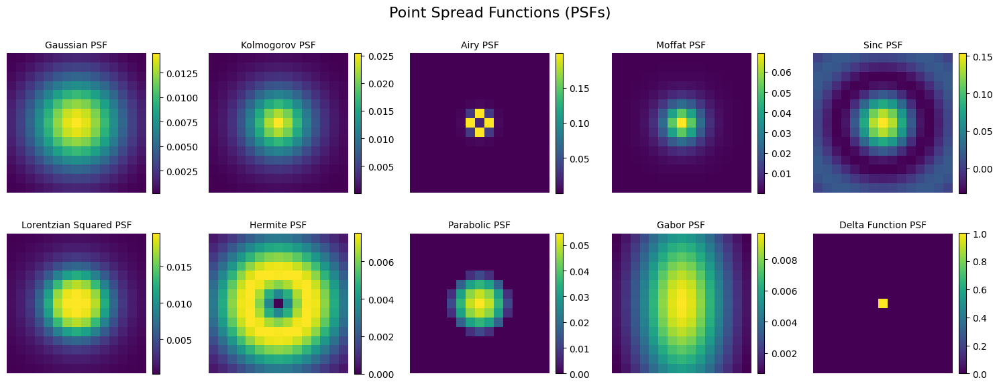

In [4]:
# Visualizing all the PSFs that will be used

psfs = [
    (gaus_psf, "Gaussian PSF"),
    (kol_psf, "Kolmogorov PSF"),
    (air_psf, "Airy PSF"),
    (mof_psf, "Moffat PSF"),
    (sinc_psf, "Sinc PSF"),
    (lor_sq_psf, "Lorentzian Squared PSF"),
    (her_psf, "Hermite PSF"),
    (par_psf, "Parabolic PSF"),
    (gab_psf, "Gabor PSF"),
    (delta_psf, "Delta Function PSF")
]

# Create subplots
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 5 columns, 2 rows
fig.suptitle("Point Spread Functions (PSFs)", fontsize=16)

# Plot each PSF
for i, (psf, label) in enumerate(psfs):
    ax = axes[i // 5, i % 5]  # Determine subplot position
    im = ax.imshow(psf, cmap='viridis')
    ax.set_title(label, fontsize=10)
    ax.axis('off')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

In [5]:
def numpy_to_tf(image):
    
    """
    Converts a numpy array into a tensorflow tensor.
    
    Parameters:
    -----------
    image : np.ndarray
        Shape (height, width, channels)
        
     Returns:
    --------
    image_tf: tf.constant
        Shape (1, height, width, channels
    """
    
    image = np.expand_dims(image, axis=0)
    image_tf = tf.constant(image, dtype=tf.float32)
    
    return image_tf

def tf_to_numpy(image_tf):
    
    """
    Converts a tensorflow tensor into a numpy array.
    
    Parameters:
    -----------
    image_tf : tf.constant
        Shape (1, height, width, channels)
        
     Returns:
    --------
    image: np.ndarray
        Shape (height, width, channels
    """
    
    image = image_tf.numpy()
    image = np.squeeze(image)
    
    return image

In [6]:
# Function to apply PSF to an image
def apply_psf(image, psf):
    
    """
    Convolve each channel of 'image' with 'psf' using 'same' padding.

    Parameters:
    -----------
    image : np.ndarray
        Shape (height, width, channels).
    psf   : np.ndarray
        Shape (kernel_height, kernel_width).
        
    Returns:
    --------
    blurred_image : np.ndarray
        Same shape as input image (height, width, channels).
    """
    
    # Prepare an output array of the same shape as 'image'
    blurred_image = np.zeros_like(image, dtype=np.float32)

    # Convolve each channel separately
    channels = image.shape[2]
    for c in range(channels):
        # convolve2d with mode='same' replicates TensorFlow's 'SAME' padding
        blurred_image[:, :, c] = convolve2d(image[:, :, c], psf, mode='same')
        
    return blurred_image
    
# Function to downsample an image
def downsample_image(image, factor):
    # Ensure the input image is a NumPy array
    if not isinstance(image, np.ndarray):
        image = np.array(image)
    
    # Get the dimensions of the image
    height, width, channels = image.shape
    
    # Initialize a list to hold the downsampled channels
    downsampled_channels = []
    
    # Downsample each channel individually
    for c in range(channels):
        channel = image[:, :, c]
        downsampled_channel = cv2.resize(channel, (width // factor, height // factor), interpolation=cv2.INTER_AREA)
        downsampled_channels.append(downsampled_channel)
    
    # Stack the downsampled channels back together
    downsampled_image = np.stack(downsampled_channels, axis=-1)
    
    return downsampled_image
    
# Function to add noise to an image
def add_awgn_noise(hsi_image, SNR_dB):
    
    """
    Add AWGN (Additive White Gaussian Noise) to the input hsi_image,
    given a desired SNR in dB. Uses NumPy only.

    Parameters
    ----------
    hsi_image : np.ndarray
        Input image of shape (rows, cols, channels).
    SNR_dB : float
        Desired SNR in decibels.

    Returns
    -------
    noisy_hsi_image : np.ndarray
        Noisy image of the same shape as hsi_image.
    """

     # Ensure float32
    hsi_image = hsi_image.astype(np.float32)

    rows, cols, channels = hsi_image.shape

    # Compute the signal power for each channel
    # shape: (channels,)
    signal_power = np.mean(hsi_image ** 2, axis=(0, 1))

    # Convert SNR from dB to linear scale
    SNR_linear = 10 ** (SNR_dB / 10.0)

    # Compute noise power and noise standard deviation per channel
    noise_power = signal_power / SNR_linear  # shape: (channels,)
    noise_std = np.sqrt(noise_power)         # shape: (channels,)

    # Reshape for broadcasting across (rows, cols)
    noise_std = noise_std.reshape((1, 1, channels))

    # Generate white Gaussian noise
    noise = np.random.normal(
        loc=0.0, 
        scale=1.0, 
        size=(rows, cols, channels)
    ).astype(np.float32)

    # Scale noise by the computed standard deviation
    noise *= noise_std

    # Add noise to the original image
    noisy_hsi_image = hsi_image + noise

    return noisy_hsi_image
    
# Function to normalize an image between 0 and 1 safely
def normalize(image):
    """
    Normalize an image to the range [0, 1] while clipping outliers.
    
    Parameters:
    -----------
    image : np.ndarray
        Input image with arbitrary range values.
    
    Returns:
    --------
    normalized_image : np.ndarray
        Normalized image in range [0, 1].
    """
    min_val, max_val = np.percentile(image, [1, 99])
    return (np.clip(image, min_val, max_val) - min_val) / (max_val - min_val)

# Function to obtain the Spectral Response Function for spectral degradation
def get_srf_bands(num_bands: int) -> np.ndarray:
    """
    Return a (num_bands, 3) array of [center_nm, low_edge_nm, high_edge_nm]
    matching the specified 'num_bands' from {1,3,4,8,16}.
    
    1-band  => IKONOS Panchromatic
    3-bands => IKONOS RGB
    4-bands => IKONOS B, G, R, NIR
    8-bands => WorldView-2 
    16-bands => WorldView-3

    Raises ValueError if num_bands is not in [1,3,4,8,16].
    """

    if num_bands == 1:
        # IKONOS panchromatic
        band_specs = np.array([
            [729.0, 409.0, 1048.0]  # center, lower, upper
        ], dtype=np.float32)
    
    elif num_bands == 3:
        # IKONOS RGB
        band_specs = np.array([
            [480.0, 421.0, 539.0],  # Blue
            [552.0, 480.0, 624.0],  # Green
            [666.0, 602.0, 729.0],  # Red
        ], dtype=np.float32)
    
    elif num_bands == 4:
        # IKONOS B, G, R, NIR
        band_specs = np.array([
            [480.0, 421.0, 539.0],  # Blue
            [552.0, 480.0, 624.0],  # Green
            [666.0, 602.0, 729.0],  # Red
            [803.0, 713.0, 893.0],  # NIR
        ], dtype=np.float32)

    elif num_bands == 8:
        # WorldView-2
        band_specs = np.array([
            [427.0, 396.0, 458.0],  # Coastal Blue
            [478.0, 442.0, 515.0],  # Blue
            [546.0, 506.0, 586.0],  # Green
            [608.0, 584.0, 632.0],  # Yellow
            [659.0, 624.0, 694.0],  # Red
            [724.0, 699.0, 749.0],  # Red Edge
            [833.0, 765.0, 901.0],  # NIR1
            [949.0, 856.0, 1043.0], # NIR2
        ], dtype=np.float32)
    
    elif num_bands == 16:
        # WorldView-3
        band_specs = np.array([
            [426.0, 397.0, 454.0],    # Coastal Blue
            [481.0, 445.0, 517.0],    # Blue
            [547.0, 507.0, 586.0],    # Green
            [605.0, 580.0, 629.0],    # Yellow
            [661.0, 626.0, 696.0],    # Red
            [724.0, 698.0, 749.0],    # Red Edge
            [832.0, 765.0, 899.0],    # NIR1
            [948.0, 857.0, 1039.0],   # NIR2
            [1210.0, 1184.0, 1235.0], # SWIR1
            [1572.0, 1546.0, 1598.0], # SWIR2
            [1661.0, 1636.0, 1686.0], # SWIR3
            [1730.0, 1702.0, 1759.0], # SWIR4
            [2164.0, 2137.0, 2191.0], # SWIR5
            [2203.0, 2174.0, 2232.0], # SWIR6
            [2260.0, 2228.0, 2292.0], # SWIR7
            [2329.0, 2285.0, 2373.0], # SWIR8
        ], dtype=np.float32)
    
    else:
        raise ValueError(f"Unsupported num_bands={num_bands}. Must be 1,3,4,8, or 16.")

    return band_specs
    
# Function to apply SRF to an image
def apply_srf(
    hyper_image: np.ndarray,
    band_specs: np.ndarray,
    fwhm_factor: float = 4.2
):
    """
    Apply a Gaussian-based SRF (based on band_specs) to the given HR hyperspectral image.
    
    Unlike the previous version, this function infers the number of HSI bands (L) 
    from hyper_image.shape, and automatically constructs a linearly-spaced 
    wavelength array from the minimum lower_edge to the maximum upper_edge 
    in band_specs.

    Parameters
    ----------
    hyper_image : np.ndarray
        (rows, cols, L) float32 (or will be converted). The high-resolution HSI.
    band_specs : np.ndarray
        (num_bands, 3) array, each row = [center_nm, low_edge_nm, upper_edge_nm].
        Examples: 
            - 1-band IKONOS Panchromatic 
            - 3-band IKONOS RGB 
            - 4-band IKONOS (B,G,R,NIR) 
            - 8-band WorldView-2 
            - 16-band WorldView-3
        etc.
    fwhm_factor : float
        Factor to convert from (upper_edge - lower_edge) to approximate standard deviation.
        By default 4.2, typical ratio (FWHM / (2.355...) or so for a Gaussian).

    Returns
    -------
    ms_image : np.ndarray
        (rows, cols, num_bands). The resulting multi/pan/RGB image.
    srf : np.ndarray
        (num_bands, L). The spectral response function for each output band
        across the L inferred HSI wavelength positions.
    auto_wavelengths : np.ndarray
        (L,) The automatically-generated wavelength array spanning 
        [min_lower_edge, max_upper_edge].
    """

    # 1) Ensure float32
    hyper_image = hyper_image.astype(np.float32)
    rows, cols, L = hyper_image.shape

    # 2) Determine the min/max edges from band_specs
    #    We will assume the entire HSI covers this range uniformly.
    #    E.g. for IKONOS Panchromatic: [409, 1048], etc.
    min_lower_edge = band_specs[:, 1].min()
    max_upper_edge = band_specs[:, 2].max()

    # 3) Construct a linearly-spaced wavelength array of length L
    #    from min_lower_edge to max_upper_edge, inclusive
    auto_wavelengths = np.linspace(min_lower_edge, max_upper_edge, L).astype(np.float32)
    # Shape: (L,)  We'll reshape to (1, L) for broadcasting
    wave_2d = auto_wavelengths[None, :]  # shape => (1, L)

    # 4) Prepare the SRF array
    num_bands = band_specs.shape[0]
    srf = np.zeros((num_bands, L), dtype=np.float32)

    for i in range(num_bands):
        center_nm = band_specs[i, 0]
        low_nm    = band_specs[i, 1]
        high_nm   = band_specs[i, 2]

        # approximate standard deviation from (high - low) / fwhm_factor
        std_nm = (high_nm - low_nm) / fwhm_factor

        # Gaussian SRF across all L wavelengths
        # shape => (1, L); after the operation => (L,) effectively
        srf_i = np.exp(-0.5 * ((wave_2d - center_nm) / std_nm) ** 2)

        # Normalize so the sum of srf_i is 1 across the L channels
        sum_i = srf_i.sum()
        if sum_i > 1e-8:
            srf_i /= sum_i

        srf[i, :] = srf_i

    # 5) Now srf has shape (num_bands, L). We want to apply it to hyper_image:
    #    hyper_image: (rows, cols, L)
    #    srf^T: (L, num_bands)
    # => tensordot => (rows, cols, num_bands)
    srf_t = srf.T  # shape => (L, num_bands)
    ms_image = np.tensordot(hyper_image, srf_t, axes=([2], [0]))  # => (rows, cols, num_bands)

    # 6) Convert to float32
    ms_image = ms_image.astype(np.float32)

    return ms_image, srf, auto_wavelengths

Functions to visualize the inputs

In [7]:
# Function to visualize an HSI
def visualize_hsi(img1, img2, bands, title1, title2):
    """
    Visualize two hyperspectral images side by side using RGB representations.

    Parameters:
    -----------
    img1 : np.ndarray
        First hyperspectral image.
    img2 : np.ndarray
        Second hyperspectral image.
    bands : tuple
        Band indices to use for RGB representation (applied to both images).
    title1 : str
        Title for the first image.
    title2 : str
        Title for the second image.
    """
    rgb1 = get_rgb(img1, bands)
    rgb2 = get_rgb(img2, bands)

    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    axs[0].imshow(rgb1)
    axs[0].set_title(title1)
    axs[0].axis('on')

    axs[1].imshow(rgb2)
    axs[1].set_title(title2)
    axs[1].axis('on')

    plt.tight_layout()
    plt.show()

# Function to visualize an MSI/RGB/Panchromatic image along with the SRF
def plot_multispectral_with_srf(ms_image1, ms_image2, bands, title1, title2, srf, wavelengths, ikonos_bands):
    """
    Visualize a multispectral (or RGB/panchromatic) image alongside its Spectral Response Function (SRF).
    
    Parameters
    ----------
    ms_image1 : np.ndarray
        First multispectral image, shape: (H, W, num_bands).
    ms_image2 : np.ndarray
        Second multispectral image, shape: (H2, W2, num_bands).
    bands : tuple
        Band indices to use for RGB visualization (must be valid for both images).
    title1 : str
        Title for the first image.
    title2 : str
        Title for the second image.
    srf : np.ndarray
        Spectral Response Function, shape: (num_bands, L).
    wavelengths : np.ndarray
        Wavelengths corresponding to the L hyperspectral bands.
    ikonos_bands : np.ndarray
        Array of shape (num_bands, 3) with [center_nm, low_edge_nm, high_edge_nm] per band.
    
    Notes
    -----
    - This function assumes num_bands is one of {1,3,4,8,16}.
    - If num_bands=1, we skip get_rgb and just display a grayscale single-band image.
    - If num_bands=3,4,8,16, we attempt to display an RGB image using 'bands' for the channel ordering.
    - The SRF curve colors and labels are chosen via if/elif blocks, 
      matching each possible number of bands.
    """
    num_bands = ms_image1.shape[2]
    assert ms_image2.shape[2] == num_bands, "Both MSI images must have the same number of bands"

    # Pick labels and colors based on number of bands
    if num_bands == 1:
        band_labels = ["Panchromatic"]
        band_colors = ["k"]
    elif num_bands == 3:
        band_labels = ["Blue", "Green", "Red"]
        band_colors = ["b", "g", "r"]
    elif num_bands == 4:
        band_labels = ["Blue", "Green", "Red", "NIR"]
        band_colors = ["b", "g", "r", "k"]
    elif num_bands == 8:
        band_labels = ["Coastal", "Blue", "Green", "Yellow", 
                       "Red", "Red Edge", "NIR1", "NIR2"]
        band_colors = ["b", "g", "r", "c", "m", "y", "k", "orange"]
    elif num_bands == 16:
        band_labels = [
            "Coastal Blue", "Blue", "Green", "Yellow", 
            "Red", "Red Edge", "NIR1", "NIR2",
            "SWIR1", "SWIR2", "SWIR3", "SWIR4",
            "SWIR5", "SWIR6", "SWIR7", "SWIR8"
        ]
        band_colors = [
            "b", "g", "r", "c", "m", "y", "k", "orange", 
            "purple", "brown", "pink", "gray", 
            "olive", "navy", "teal", "maroon"
        ]
    else:
        raise ValueError("Function only supports images with 1, 3, 4, 8, or 16 bands.")

    # Create figure with 3 subplots (2 for images, 1 for SRF)
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))

    # Plot first image
    if num_bands == 1:
        axs[0].imshow(ms_image1[:, :, 0], cmap='gray')
        axs[0].set_title(title1 + " (Panchromatic)")
    else:
        rgb1 = get_rgb(ms_image1, bands)
        axs[0].imshow(rgb1)
        axs[0].set_title(title1)
    axs[0].axis('off')

    # Plot second image
    if num_bands == 1:
        axs[1].imshow(ms_image2[:, :, 0], cmap='gray')
        axs[1].set_title(title2 + " (Panchromatic)")
    else:
        rgb2 = get_rgb(ms_image2, bands)
        axs[1].imshow(rgb2)
        axs[1].set_title(title2)
    axs[1].axis('off')

    # Plot SRF
    for i in range(num_bands):
        center_nm = ikonos_bands[i, 0]
        axs[2].plot(
            wavelengths,
            srf[i, :],
            label=f'{band_labels[i]} (Center: {center_nm} nm)',
            color=band_colors[i]
        )
    axs[2].set_xlabel('Wavelength (nm)')
    axs[2].set_ylabel('Spectral Response')
    axs[2].set_title('Spectral Response Functions (SRF)')
    axs[2].legend()
    axs[2].grid(True)

    plt.tight_layout()
    plt.show()
    
# Function to plot the spectra at input pixels  
def plot_spectra(ground_truth_hsi, super_resolved_hsi, x, y):
    """
    Plotting the spectra of two hyperspectral images at a specific pixel location.
    
    Inputs:
    ground_truth_hsi (numpy.ndarray): The ground truth hyperspectral image
    super_resolved_hsi (numpy.ndarray): The super resolved hyperspectral image (output of model)
    x (int): The x pixel location
    y (int): The y pixel location
    """
    
    ground_truth_hsi = ground_truth_hsi.astype(np.float32)
    super_resolved_hsi = super_resolved_hsi.astype(np.float32)
    
    # Extract the spectra at the specific pixel location (x,y)
    ground_truth_spectra = ground_truth_hsi[y, x, :]
    super_resolved_spectra = super_resolved_hsi[y, x, :]
    
    # Number of spectral bands
    num_bands = ground_truth_hsi.shape[2]
    print("Number of bands = ", num_bands)
    
    # Plot the spectra
    plt.figure(figsize=(10,5))
    plt.plot(range(num_bands), ground_truth_spectra, label='Ground Truth Spectra')
    plt.plot(range(num_bands), super_resolved_spectra, label='Super Resolved Spectra')
    
    # Add labels and title
    plt.xlabel('Spectral band')
    plt.ylabel('Reflectance')
    plt.title(f'Spectra at pixel location (x={x}, y={y})')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

Synthetic input generation functions

In [8]:
# Function to spatially degrade an image
def spatial_degradation(image, psf, downsample_ratio, SNR):
    """
    Apply spatial degradation to an image.
    
    Parameters:
    -----------
    image : np.ndarray
        Input image.
    psf : np.ndarray
        Point Spread Function.
    downsample_ratio : int
        Factor by which to downsample.
    SNR : float
        Signal-to-Noise Ratio for noise addition.
    
    Returns:
    --------
    degraded_image : np.ndarray
        Spatially degraded image.
    """
    I_HS = normalize(image)
    I_HS = apply_psf(I_HS, psf)
    I_HS = downsample_image(I_HS, downsample_ratio)
    I_HS = add_awgn_noise(I_HS, SNR)
    return I_HS

# Function to spectrally degrade an image
def spectral_degradation(image, SNR, num_bands=4, fwhm_factor=4.3):
    """
    Apply spectral degradation to an image.
    
    Parameters
    ----------
    image : np.ndarray
        Input HSI image, shape (rows, cols, L).
    SNR : float
        Signal-to-Noise Ratio for noise addition.
    num_bands : int
        Desired number of output bands. Must be one of {1,3,4,8,16}.
        1 => IKONOS Panchromatic
        3 => IKONOS RGB
        4 => IKONOS B/G/R/NIR
        8 => WorldView-2
        16 => WorldView-3
    fwhm_factor : float
        Factor to approximate std dev from (upper_edge - lower_edge).
        Default=4.2 is typical for a rough Gaussian FWHM approximation.

    Returns
    -------
    I_MS : np.ndarray
        Spectrally degraded image of shape (rows, cols, num_bands).
    srf : np.ndarray
        The sensor SRF curves, shape (num_bands, L).
    band_specs : np.ndarray
        The band specs used, shape (num_bands, 3).
    auto_wavelengths : np.ndarray
        The automatically generated wavelengths, shape (L,).
    """
    
    # 1) Fetch the band specs for the desired sensor configuration
    band_specs = get_srf_bands(num_bands)

    # 2) Normalize the image to [0,1] (or however your normalize function works)
    I_MS = normalize(image)

    # 3) Apply the SRF to produce the 'multispectral' (or panchromatic/RGB) image
    I_MS, srf, auto_wavelengths = apply_srf(I_MS, band_specs, fwhm_factor=fwhm_factor)

    # 4) Add AWGN noise
    I_MS = add_awgn_noise(I_MS, SNR)

    # 5) Return the result plus info you might need for plotting or further usage
    return I_MS, srf, band_specs, auto_wavelengths

Importing and degrading the Botswana HSI

In [9]:
# Get the current working directory
notebook_directory = os.getcwd()

# Define the relative path to the dataset
dataset_relative_path = "../../../Datasets/Synthetic_data/"

# Construct the full path to the dataset
dataset_path = os.path.join(notebook_directory, dataset_relative_path)

# Normalize the path to remove redundancies
normalized_dataset_path = os.path.normpath(dataset_path)

# Define the data file path
mat_file_path = os.path.join(normalized_dataset_path, 'Botswana_data.mat')

In [10]:
def split_train_test(image, split_index):
    return image[:split_index], image[split_index:]

# Split HR MSI (same resolution, just varying bands)
def split_msi(msi_image):
    return split_train_test(msi_image, 1152)

# Split LR HSI based on downsampling factor
def split_lr_hsi(hsi_image, downsample_factor):
    split_index = int(1152 / downsample_factor)
    return split_train_test(hsi_image, split_index)

Setting up and visualizing the ground truth and MSI, Pan, RGB images

Ground truth train shape:  (1152, 256, 145)
Ground truth test shape:  (320, 256, 145)


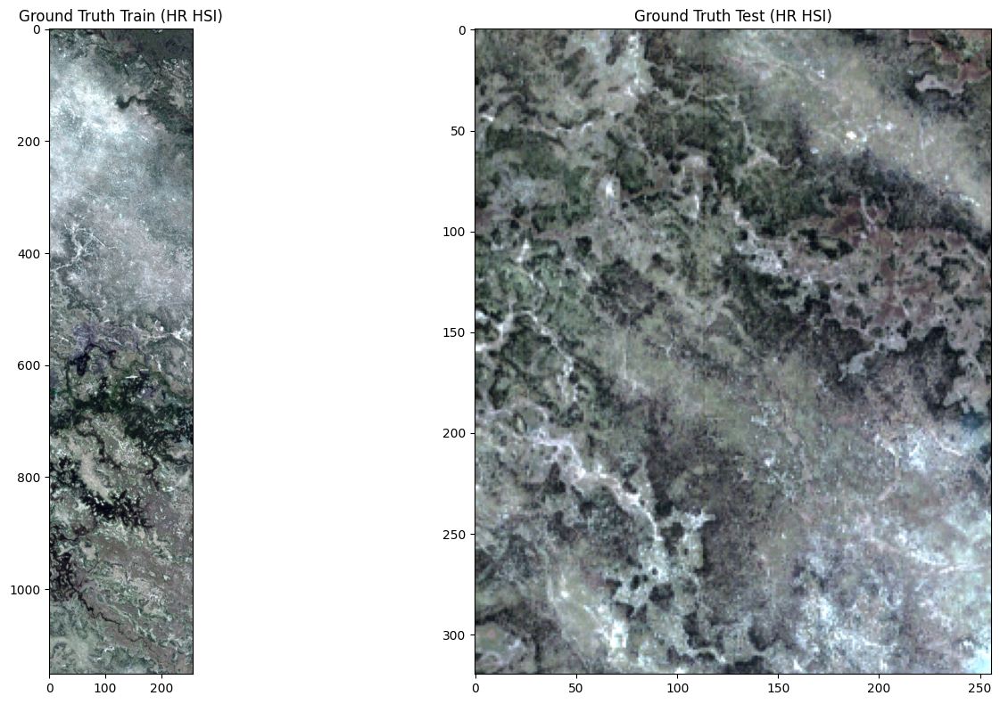

MSI train shape:  (1152, 256, 1)
MSI test shape:  (320, 256, 1)


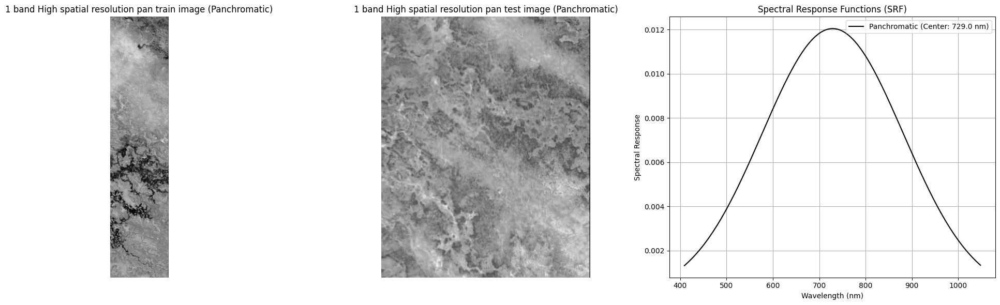

MSI train shape:  (1152, 256, 3)
MSI test shape:  (320, 256, 3)


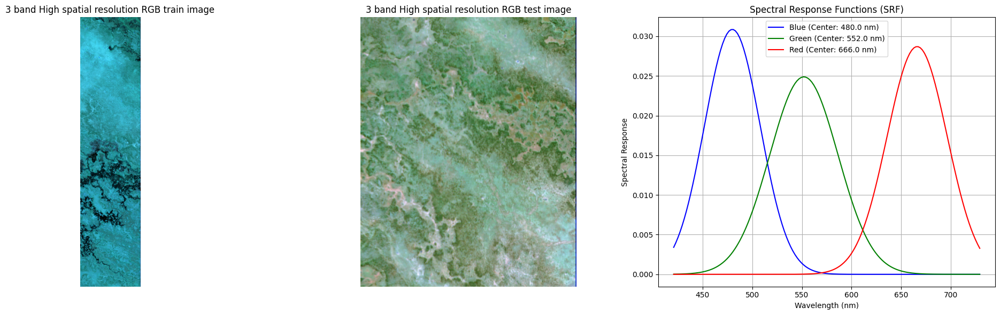

MSI train shape:  (1152, 256, 4)
MSI test shape:  (320, 256, 4)


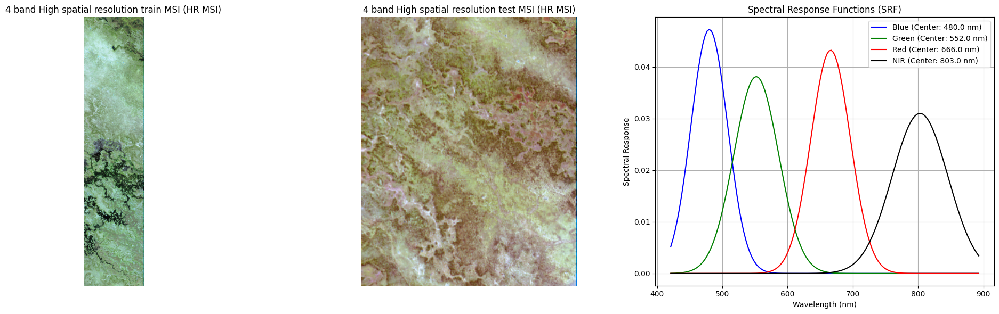

MSI train shape:  (1152, 256, 8)
MSI test shape:  (320, 256, 8)


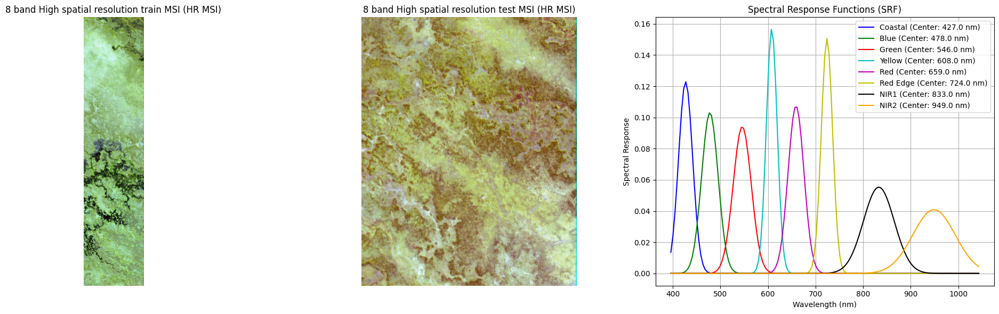

MSI train shape:  (1152, 256, 16)
MSI test shape:  (320, 256, 16)


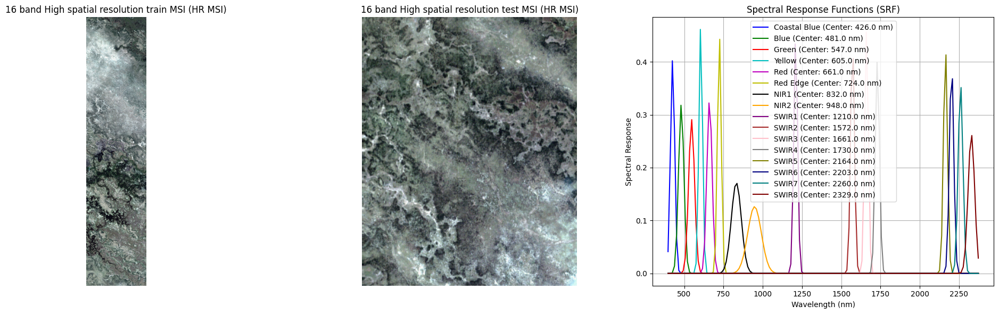

In [11]:
botswana = sio.loadmat(mat_file_path)
botswana_image = botswana['Botswana']
botswana_image = botswana_image[:1472, :, :]

# Ground Truth HR HSI (H, W, C)
I_REF = normalize(botswana_image)
I_REF_train, I_REF_test = split_msi(I_REF)
print("Ground truth train shape: ", I_REF_train.shape)
print("Ground truth test shape: ", I_REF_test.shape)
visualize_hsi(I_REF_train, I_REF_test, (20, 9, 5), "Ground Truth Train (HR HSI)", "Ground Truth Test (HR HSI)")

# High Resolution MSI with 1 band
I_MS_1, srf_1, band_specs_1, auto_wavs_1 = spectral_degradation(image=botswana_image, SNR=40, num_bands=1, fwhm_factor=4.2)
I_MS_1_train, I_MS_1_test = split_msi(I_MS_1)
print("MSI train shape: ", I_MS_1_train.shape)
print("MSI test shape: ", I_MS_1_test.shape)
plot_multispectral_with_srf(I_MS_1_train, I_MS_1_test, None, "1 band High spatial resolution pan train image", "1 band High spatial resolution pan test image", srf_1, auto_wavs_1, band_specs_1)

# High Resolution MSI with 3 bands
I_MS_3, srf_3, band_specs_3, auto_wavs_3 = spectral_degradation(image=botswana_image, SNR=40, num_bands=3, fwhm_factor=4.2)
I_MS_3_train, I_MS_3_test = split_msi(I_MS_3)
print("MSI train shape: ", I_MS_3_train.shape)
print("MSI test shape: ", I_MS_3_test.shape)
plot_multispectral_with_srf(I_MS_3_train, I_MS_3_test, (2,1,0), "3 band High spatial resolution RGB train image", "3 band High spatial resolution RGB test image", srf_3, auto_wavs_3, band_specs_3)

# High Resolution MSI with 4 bands
I_MS_4, srf_4, band_specs_4, auto_wavs_4 = spectral_degradation(image=botswana_image, SNR=40, num_bands=4, fwhm_factor=4.2)
I_MS_4_train, I_MS_4_test = split_msi(I_MS_4)
print("MSI train shape: ", I_MS_4_train.shape)
print("MSI test shape: ", I_MS_4_test.shape)
plot_multispectral_with_srf(I_MS_4_train, I_MS_4_test, (2,1,0), "4 band High spatial resolution train MSI (HR MSI)", "4 band High spatial resolution test MSI (HR MSI)", srf_4, auto_wavs_4, band_specs_4)

# High Resolution MSI with 8 bands
I_MS_8, srf_8, band_specs_8, auto_wavs_8 = spectral_degradation(image=botswana_image, SNR=40, num_bands=8, fwhm_factor=4.2)
I_MS_8_train, I_MS_8_test = split_msi(I_MS_8)
print("MSI train shape: ", I_MS_8_train.shape)
print("MSI test shape: ", I_MS_8_test.shape)
plot_multispectral_with_srf(I_MS_8_train, I_MS_8_test, (4,2,1), "8 band High spatial resolution train MSI (HR MSI)", "8 band High spatial resolution test MSI (HR MSI)", srf_8, auto_wavs_8, band_specs_8)

# High Resolution MSI with 16 bands
I_MS_16, srf_16, band_specs_16, auto_wavs_16 = spectral_degradation(image=botswana_image, SNR=40, num_bands=16, fwhm_factor=4.2)
I_MS_16_train, I_MS_16_test = split_msi(I_MS_16)
print("MSI train shape: ", I_MS_16_train.shape)
print("MSI test shape: ", I_MS_16_test.shape)
plot_multispectral_with_srf(I_MS_16_train, I_MS_16_test, (4,2,1), "16 band High spatial resolution train MSI (HR MSI)", "16 band High spatial resolution test MSI (HR MSI)", srf_16, auto_wavs_16, band_specs_16)

Setting up and visualizing the HSI images with Gaussian PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


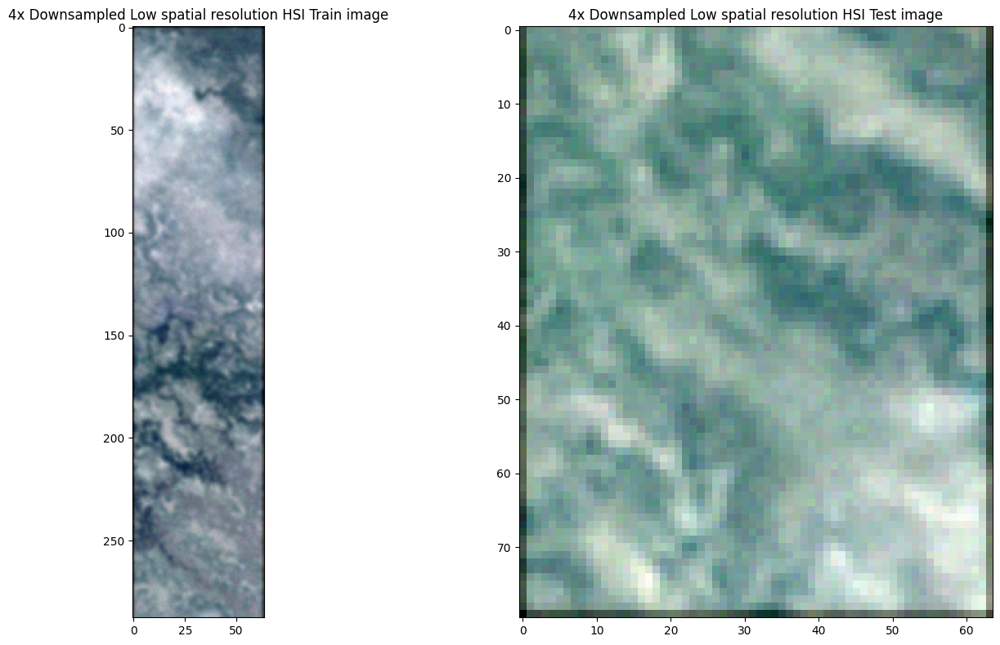

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


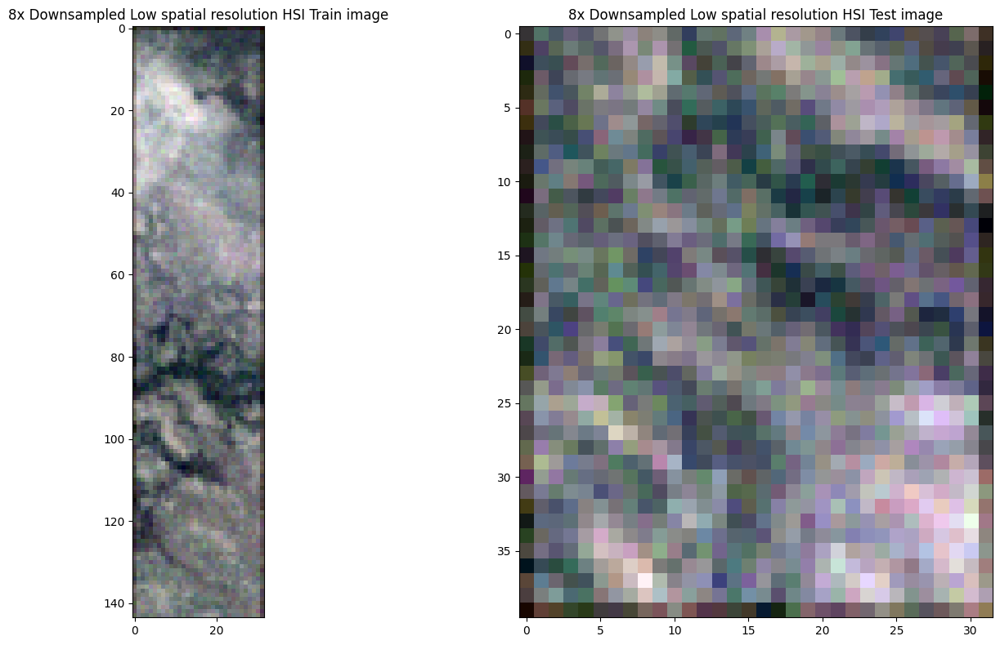

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


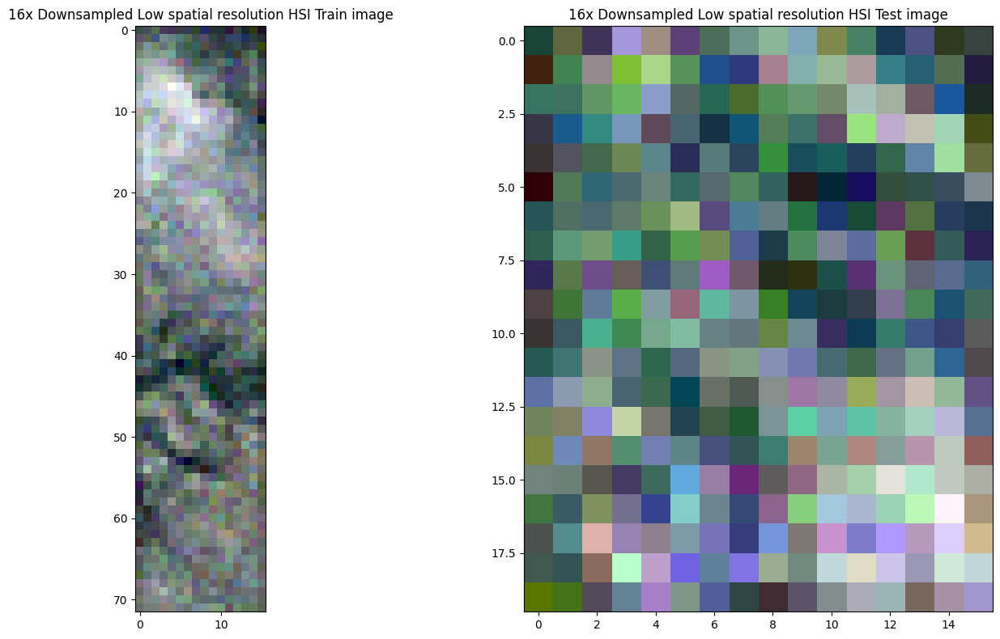

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


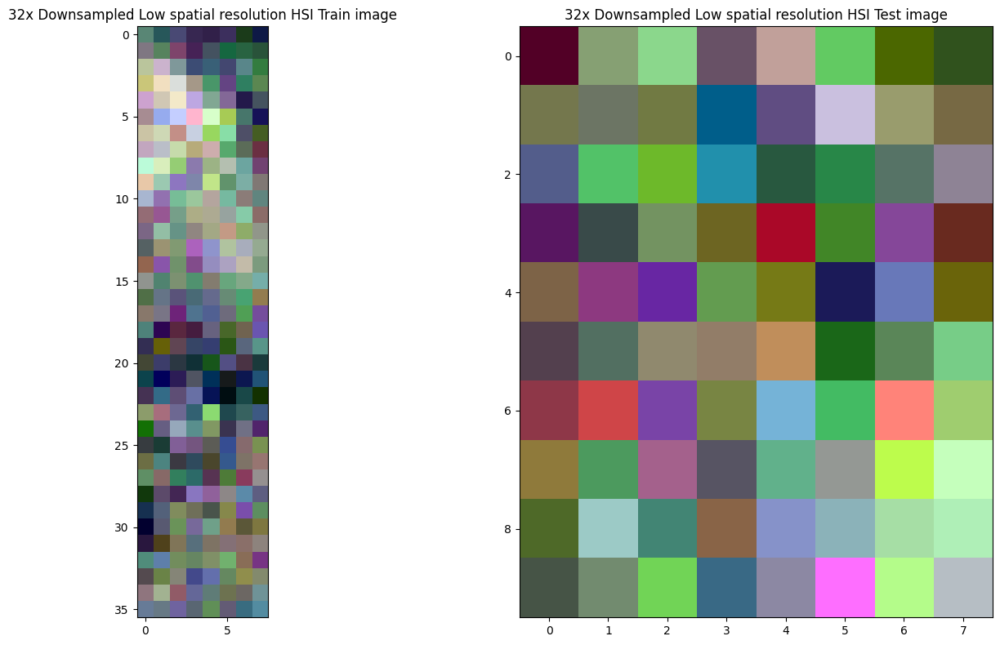

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_gaus = spatial_degradation(botswana_image, gaus_psf, 4, 35)
I_HS_4_train_gaus, I_HS_4_test_gaus = split_lr_hsi(I_HS_4_gaus, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_gaus.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_gaus.shape)
visualize_hsi(I_HS_4_train_gaus, I_HS_4_test_gaus, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_gaus = spatial_degradation(botswana_image, gaus_psf, 8, 30)
I_HS_8_train_gaus, I_HS_8_test_gaus = split_lr_hsi(I_HS_8_gaus, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_gaus.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_gaus.shape)
visualize_hsi(I_HS_8_train_gaus, I_HS_8_test_gaus, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_gaus = spatial_degradation(botswana_image, gaus_psf, 16, 25)
I_HS_16_train_gaus, I_HS_16_test_gaus = split_lr_hsi(I_HS_16_gaus, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_gaus.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_gaus.shape)
visualize_hsi(I_HS_16_train_gaus, I_HS_16_test_gaus, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_gaus = spatial_degradation(botswana_image, gaus_psf, 32, 20)
I_HS_32_train_gaus, I_HS_32_test_gaus = split_lr_hsi(I_HS_32_gaus, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_gaus.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_gaus.shape)
visualize_hsi(I_HS_32_train_gaus, I_HS_32_test_gaus, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Kolmogorv PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


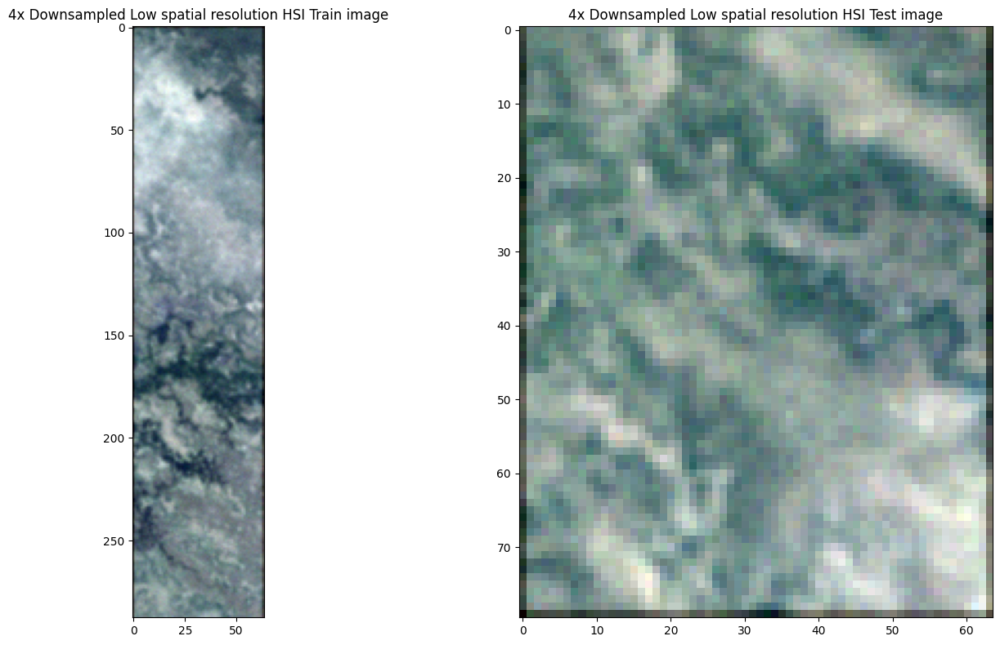

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


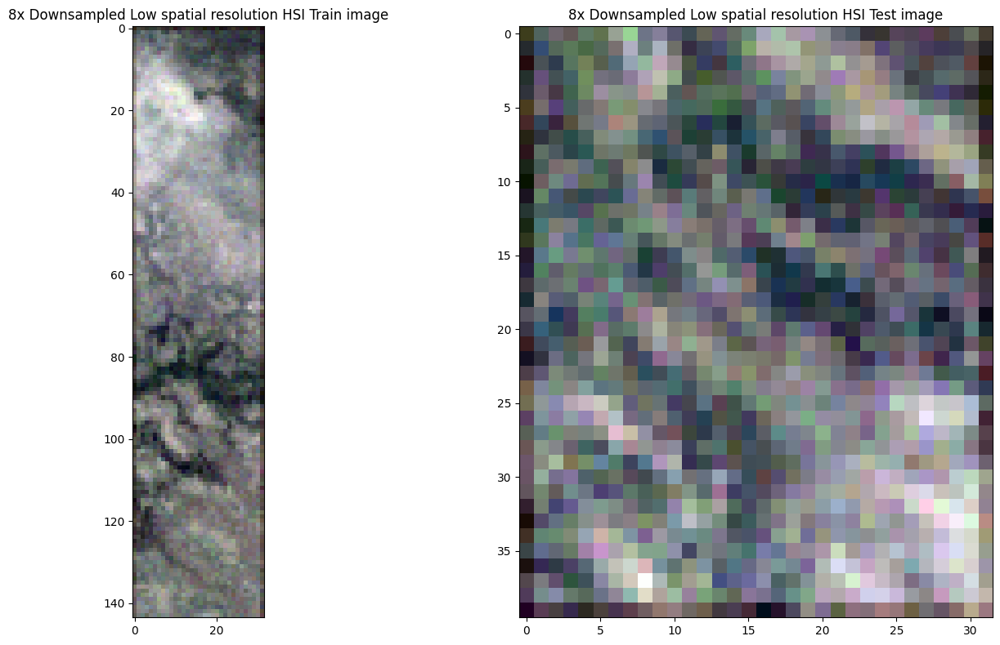

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


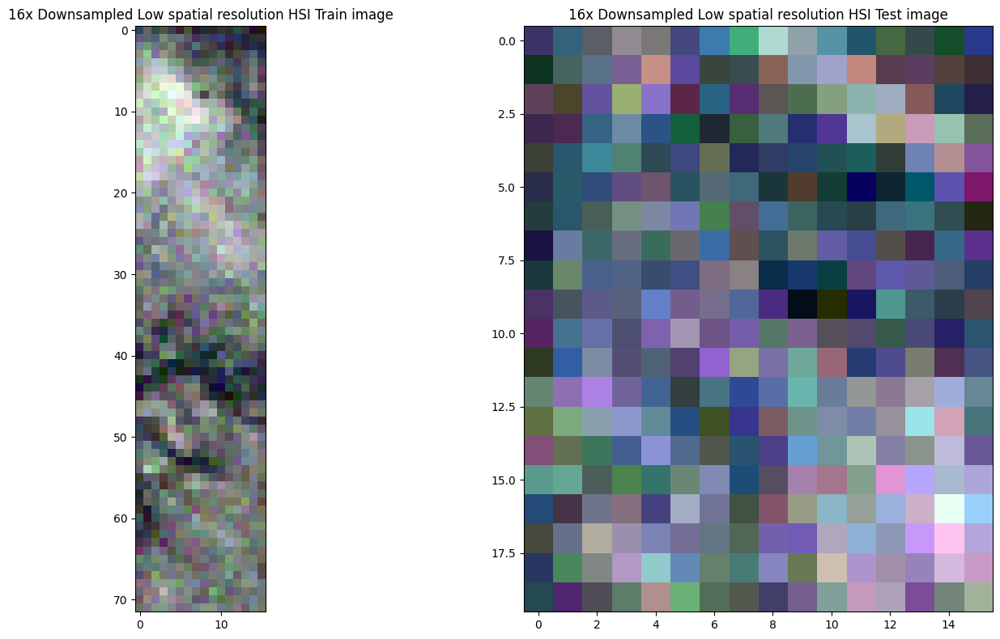

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


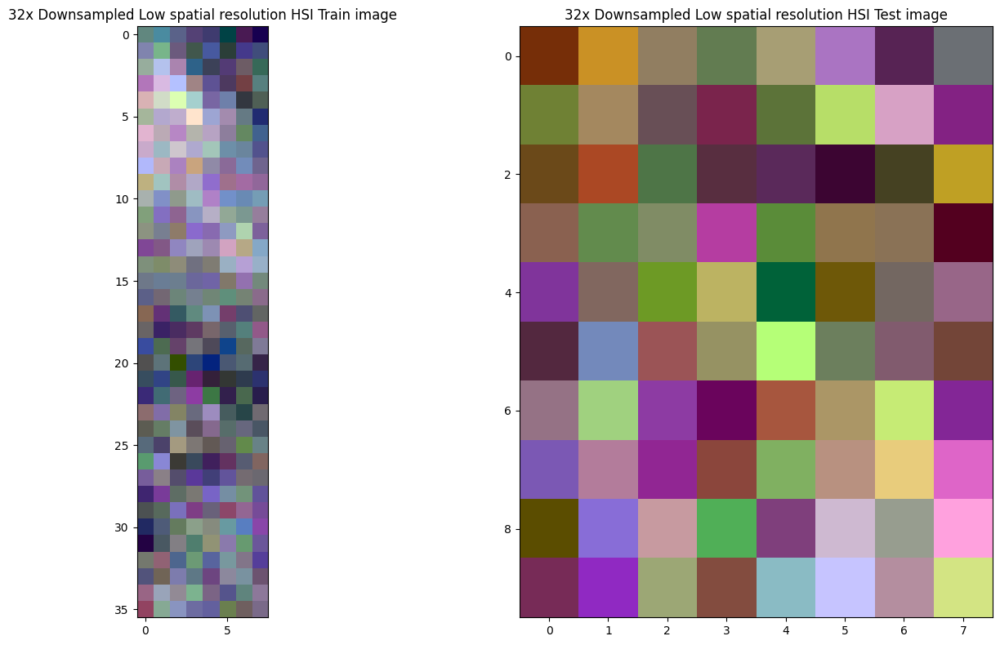

In [13]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_kol = spatial_degradation(botswana_image, kol_psf, 4, 35)
I_HS_4_train_kol, I_HS_4_test_kol = split_lr_hsi(I_HS_4_kol, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_kol.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_kol.shape)
visualize_hsi(I_HS_4_train_kol, I_HS_4_test_kol, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_kol = spatial_degradation(botswana_image, kol_psf, 8, 30)
I_HS_8_train_kol, I_HS_8_test_kol = split_lr_hsi(I_HS_8_kol, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_kol.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_kol.shape)
visualize_hsi(I_HS_8_train_kol, I_HS_8_test_kol, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_kol = spatial_degradation(botswana_image, kol_psf, 16, 25)
I_HS_16_train_kol, I_HS_16_test_kol = split_lr_hsi(I_HS_16_kol, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_kol.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_kol.shape)
visualize_hsi(I_HS_16_train_kol, I_HS_16_test_kol, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_kol = spatial_degradation(botswana_image, kol_psf, 32, 20)
I_HS_32_train_kol, I_HS_32_test_kol = split_lr_hsi(I_HS_32_kol, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_kol.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_kol.shape)
visualize_hsi(I_HS_32_train_kol, I_HS_32_test_kol, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Airy PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


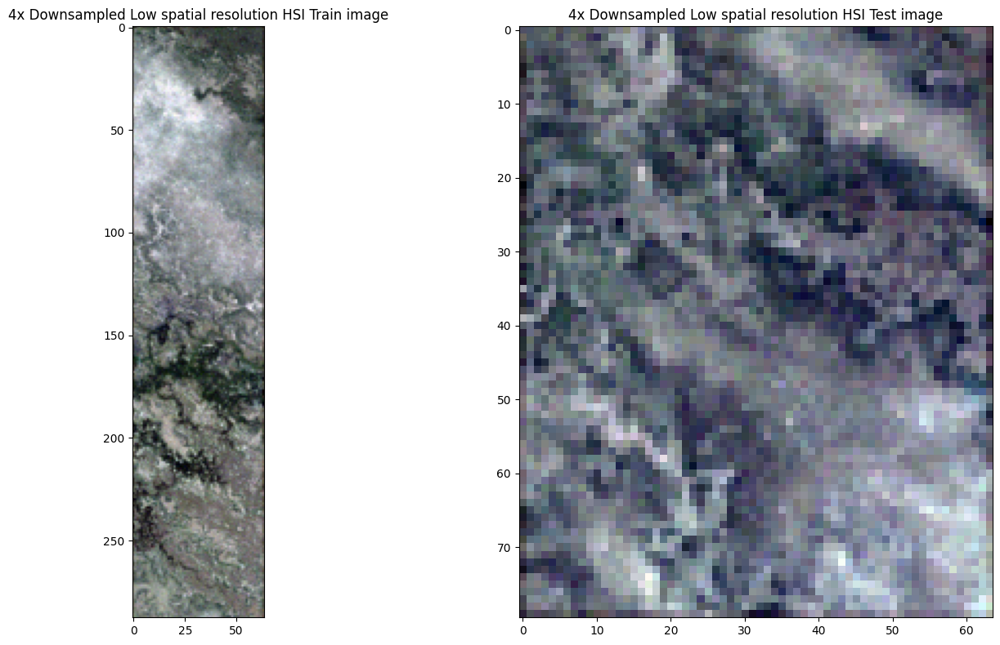

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


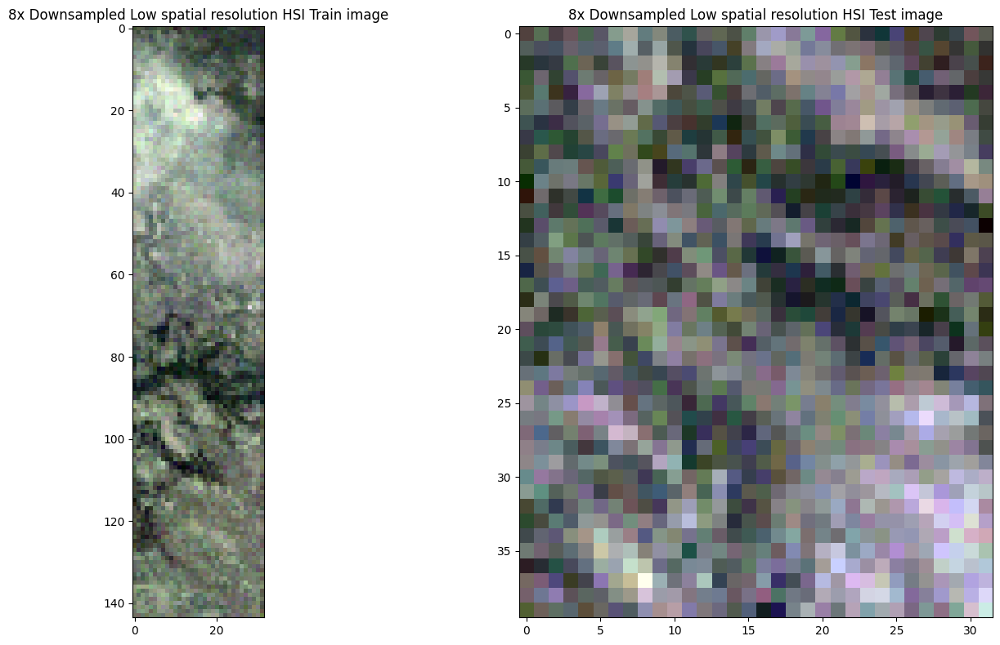

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


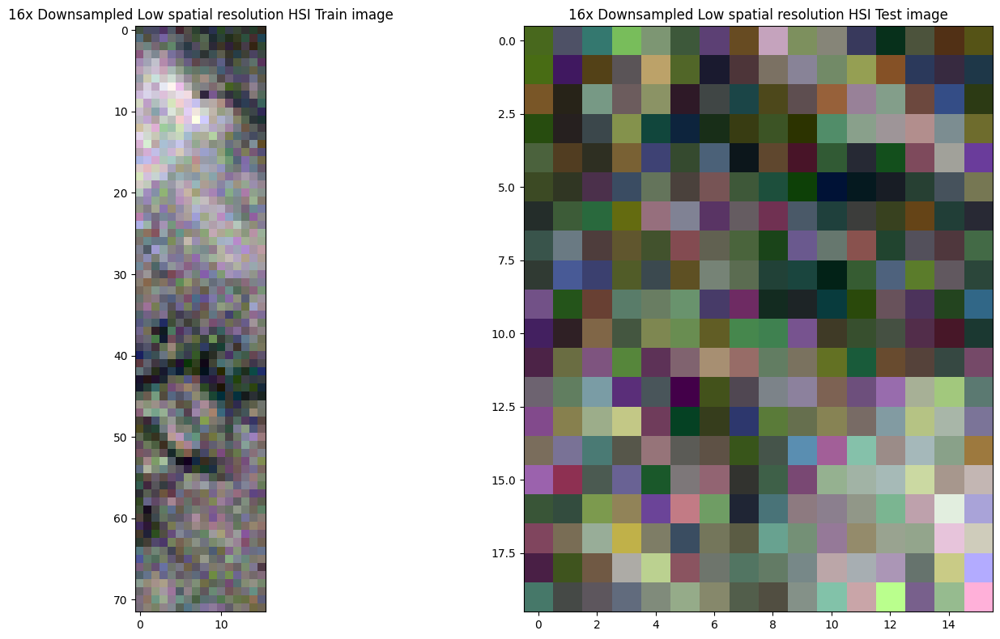

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


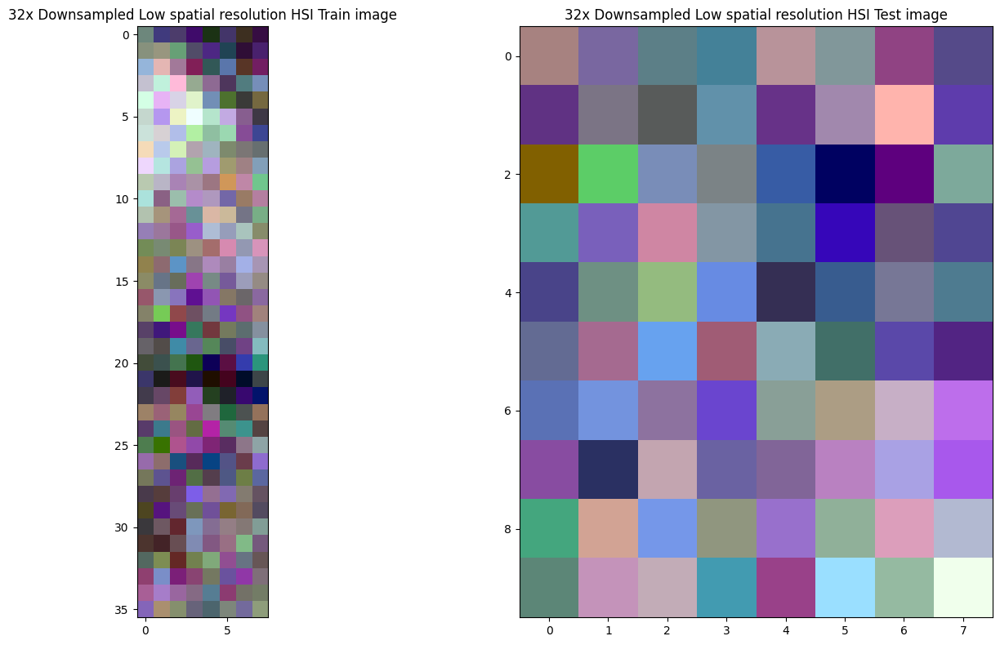

In [14]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_air = spatial_degradation(botswana_image, air_psf, 4, 35)
I_HS_4_train_air, I_HS_4_test_air = split_lr_hsi(I_HS_4_air, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_air.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_air.shape)
visualize_hsi(I_HS_4_train_air, I_HS_4_test_air, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_air = spatial_degradation(botswana_image, air_psf, 8, 30)
I_HS_8_train_air, I_HS_8_test_air = split_lr_hsi(I_HS_8_air, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_air.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_air.shape)
visualize_hsi(I_HS_8_train_air, I_HS_8_test_air, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_air = spatial_degradation(botswana_image, air_psf, 16, 25)
I_HS_16_train_air, I_HS_16_test_air = split_lr_hsi(I_HS_16_air, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_air.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_air.shape)
visualize_hsi(I_HS_16_train_air, I_HS_16_test_air, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_air = spatial_degradation(botswana_image, air_psf, 32, 20)
I_HS_32_train_air, I_HS_32_test_air = split_lr_hsi(I_HS_32_air, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_air.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_air.shape)
visualize_hsi(I_HS_32_train_air, I_HS_32_test_air, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Moffat PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


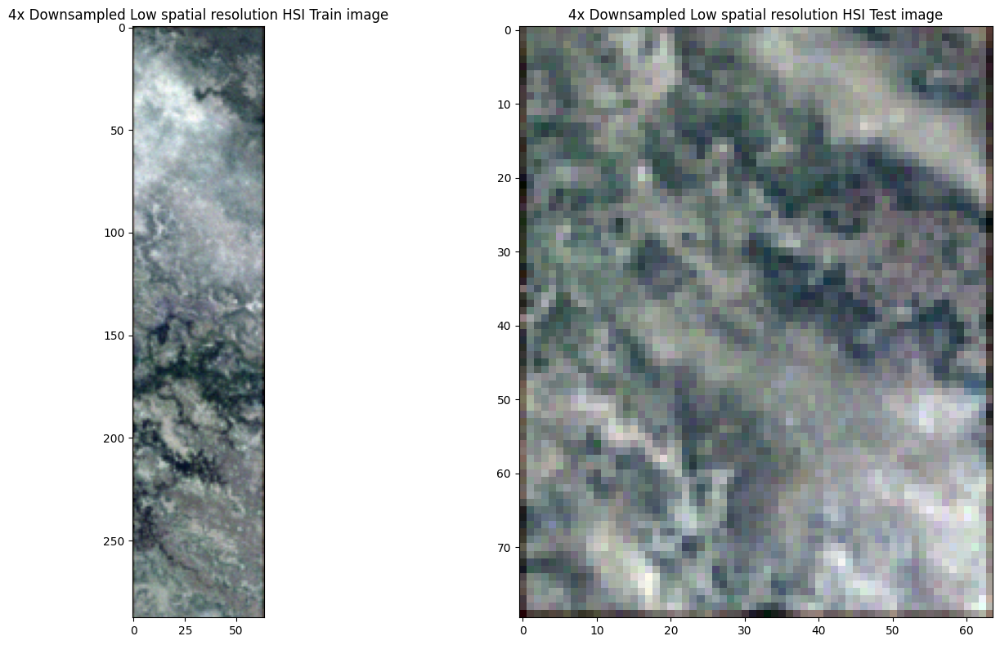

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


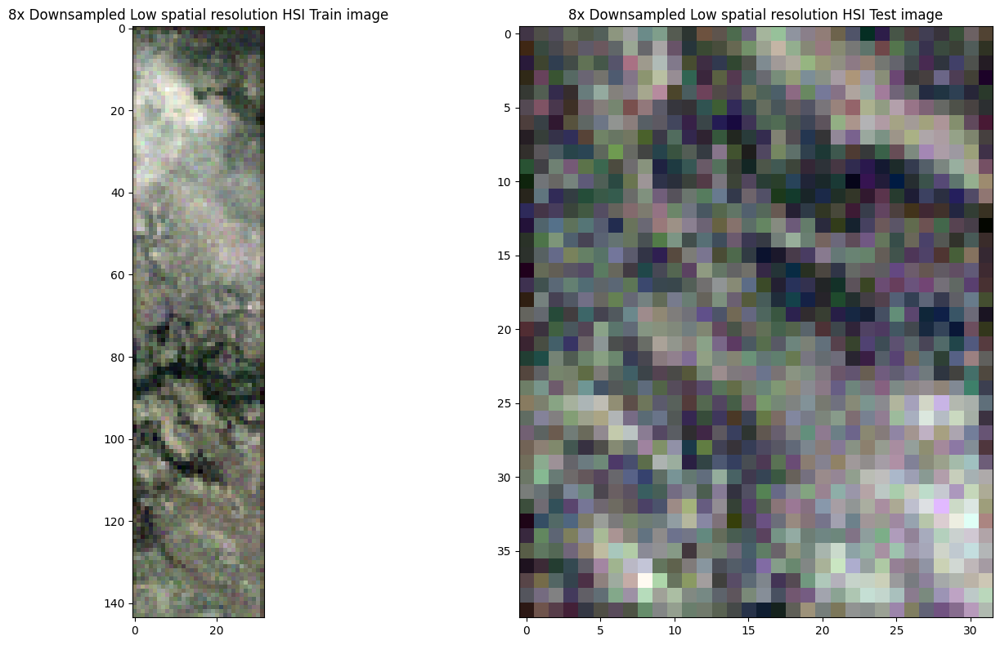

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


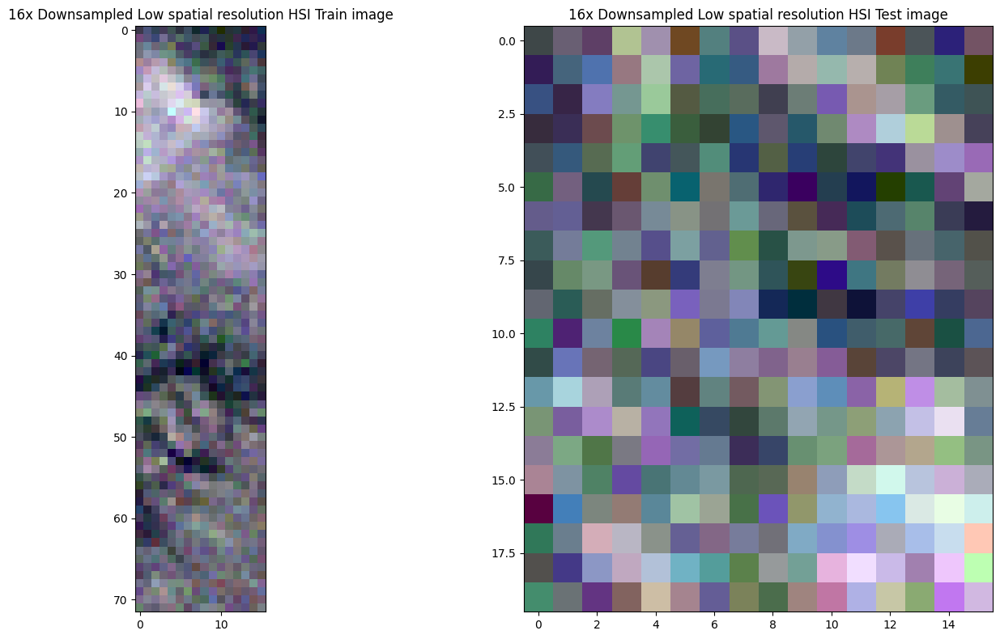

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


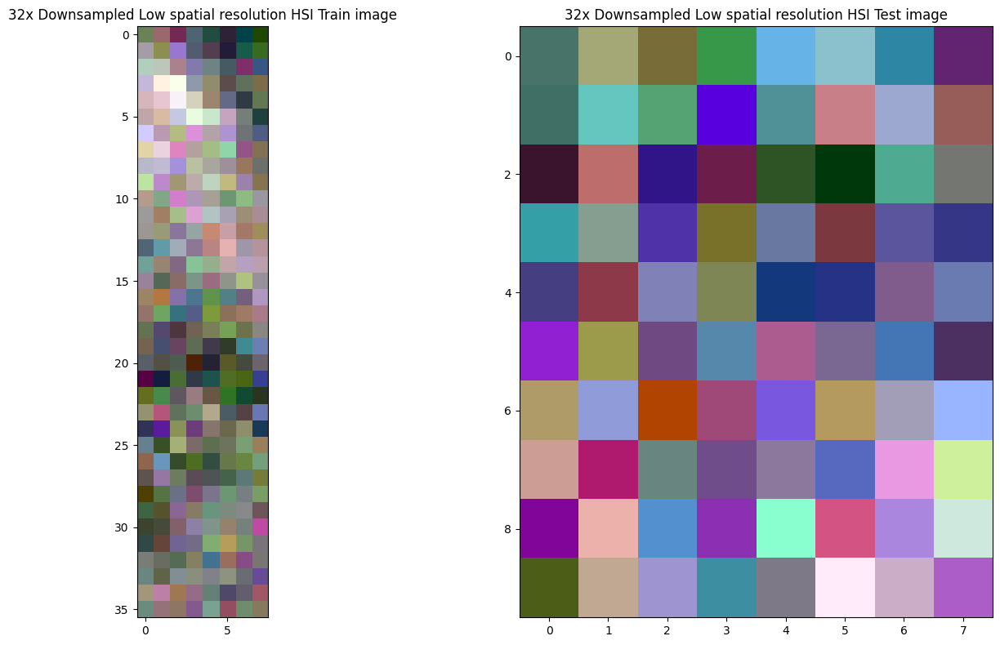

In [15]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_mof = spatial_degradation(botswana_image, mof_psf, 4, 35)
I_HS_4_train_mof, I_HS_4_test_mof = split_lr_hsi(I_HS_4_mof, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_mof.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_mof.shape)
visualize_hsi(I_HS_4_train_mof, I_HS_4_test_mof, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_mof = spatial_degradation(botswana_image, mof_psf, 8, 30)
I_HS_8_train_mof, I_HS_8_test_mof = split_lr_hsi(I_HS_8_mof, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_mof.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_mof.shape)
visualize_hsi(I_HS_8_train_mof, I_HS_8_test_mof, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_mof = spatial_degradation(botswana_image, mof_psf, 16, 25)
I_HS_16_train_mof, I_HS_16_test_mof = split_lr_hsi(I_HS_16_mof, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_mof.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_mof.shape)
visualize_hsi(I_HS_16_train_mof, I_HS_16_test_mof, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_mof = spatial_degradation(botswana_image, mof_psf, 32, 20)
I_HS_32_train_mof, I_HS_32_test_mof = split_lr_hsi(I_HS_32_mof, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_mof.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_mof.shape)
visualize_hsi(I_HS_32_train_mof, I_HS_32_test_mof, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Sinc PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


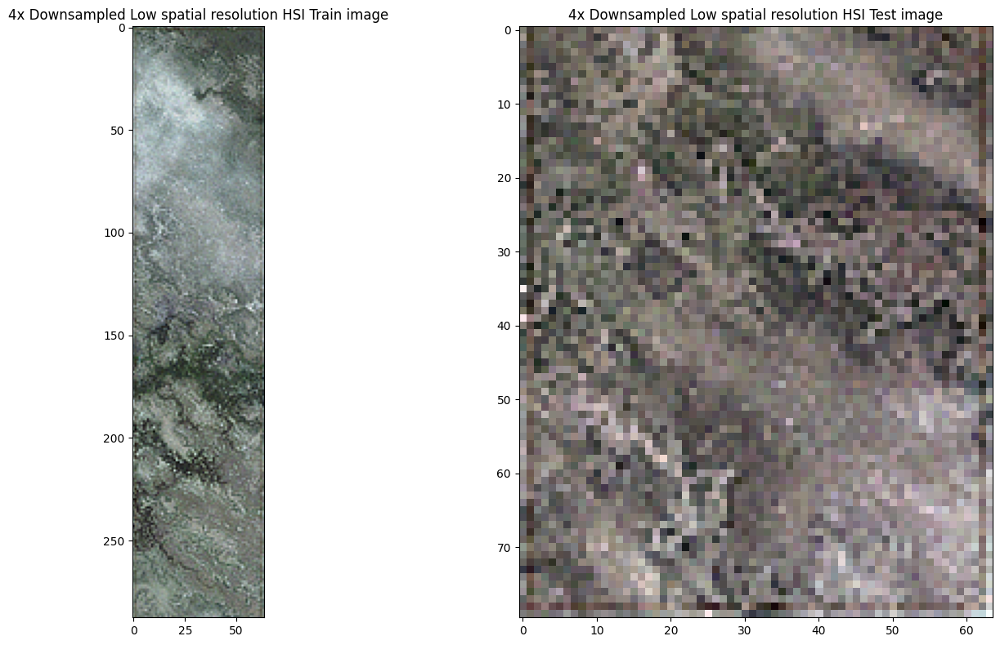

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


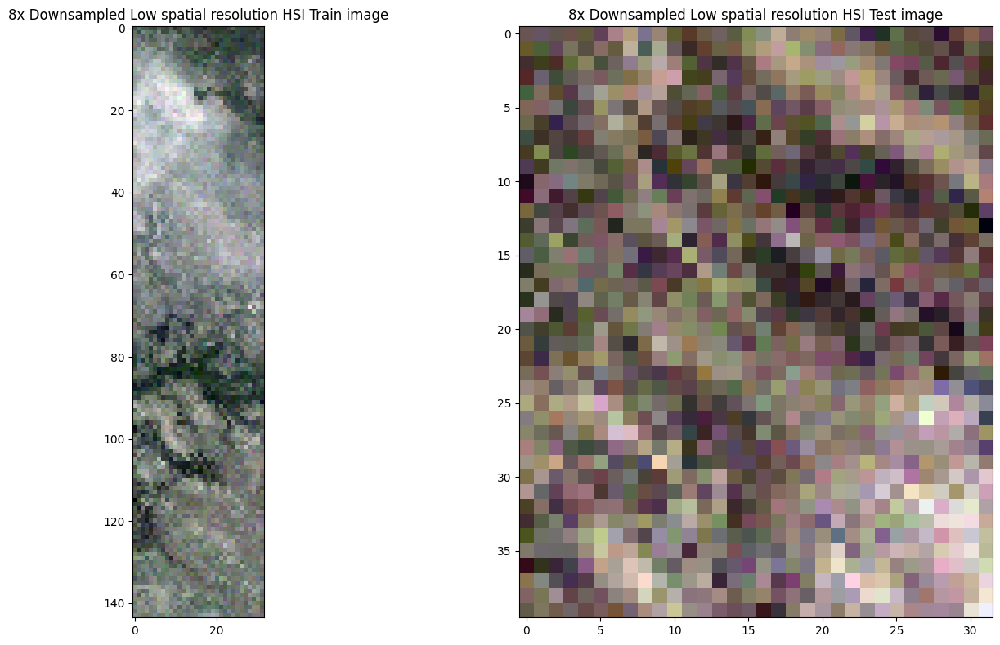

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


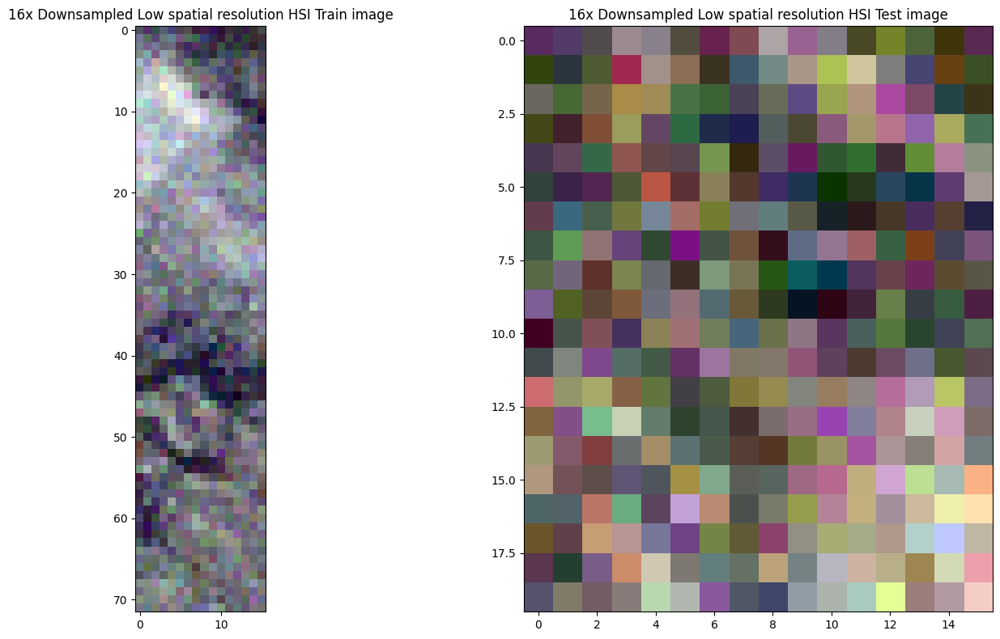

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


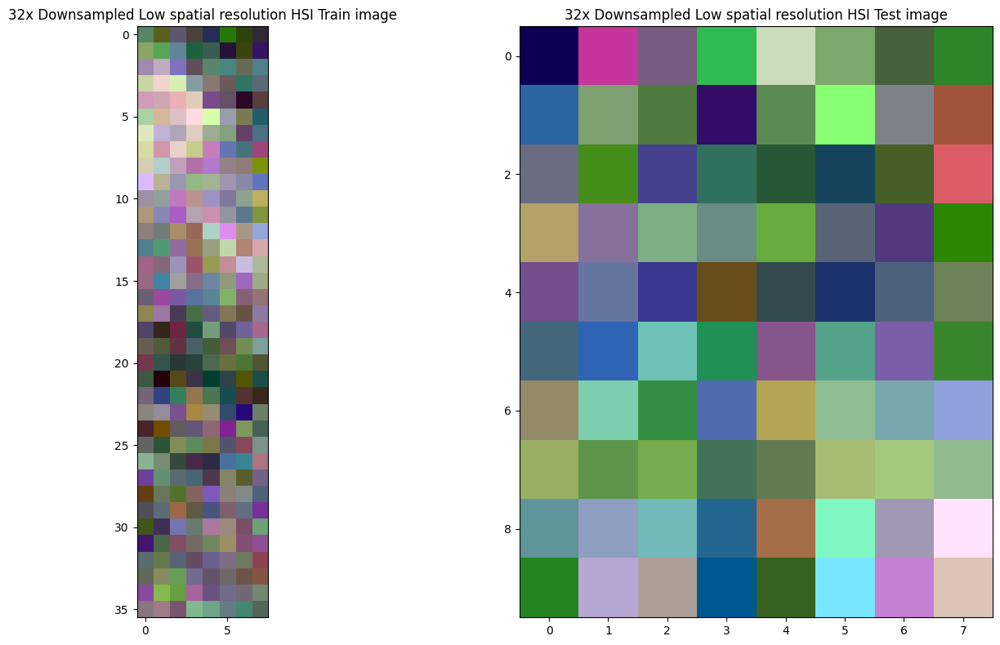

In [16]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_sinc = spatial_degradation(botswana_image, sinc_psf, 4, 35)
I_HS_4_train_sinc, I_HS_4_test_sinc = split_lr_hsi(I_HS_4_sinc, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_sinc.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_sinc.shape)
visualize_hsi(I_HS_4_train_sinc, I_HS_4_test_sinc, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_sinc = spatial_degradation(botswana_image, sinc_psf, 8, 30)
I_HS_8_train_sinc, I_HS_8_test_sinc = split_lr_hsi(I_HS_8_sinc, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_sinc.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_sinc.shape)
visualize_hsi(I_HS_8_train_sinc, I_HS_8_test_sinc, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_sinc = spatial_degradation(botswana_image, sinc_psf, 16, 25)
I_HS_16_train_sinc, I_HS_16_test_sinc = split_lr_hsi(I_HS_16_sinc, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_sinc.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_sinc.shape)
visualize_hsi(I_HS_16_train_sinc, I_HS_16_test_sinc, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_sinc = spatial_degradation(botswana_image, sinc_psf, 32, 20)
I_HS_32_train_sinc, I_HS_32_test_sinc = split_lr_hsi(I_HS_32_sinc, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_sinc.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_sinc.shape)
visualize_hsi(I_HS_32_train_sinc, I_HS_32_test_sinc, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Lorentzian Squared PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


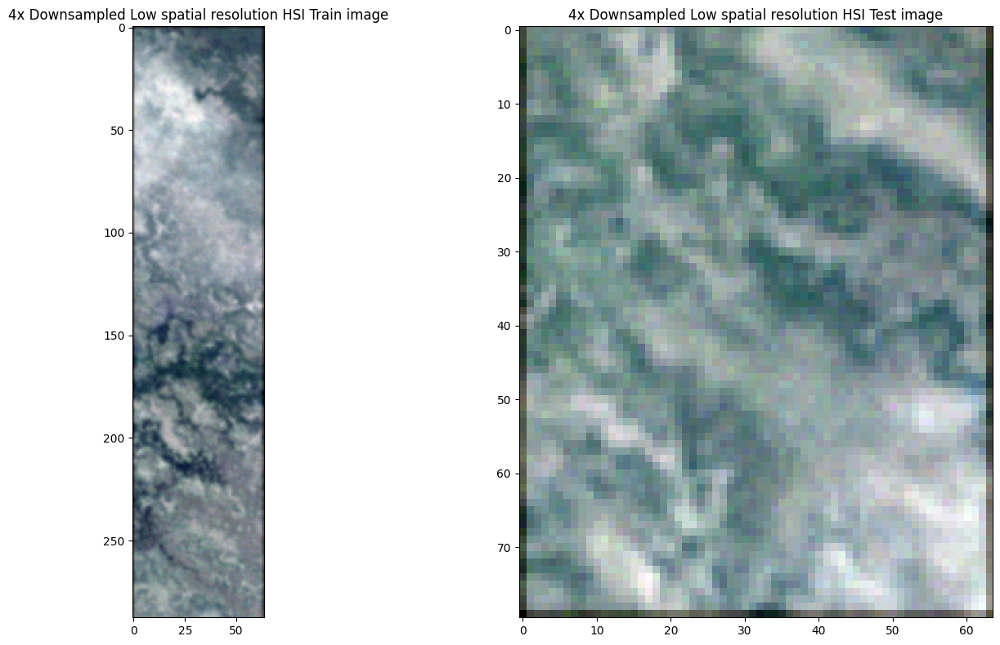

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


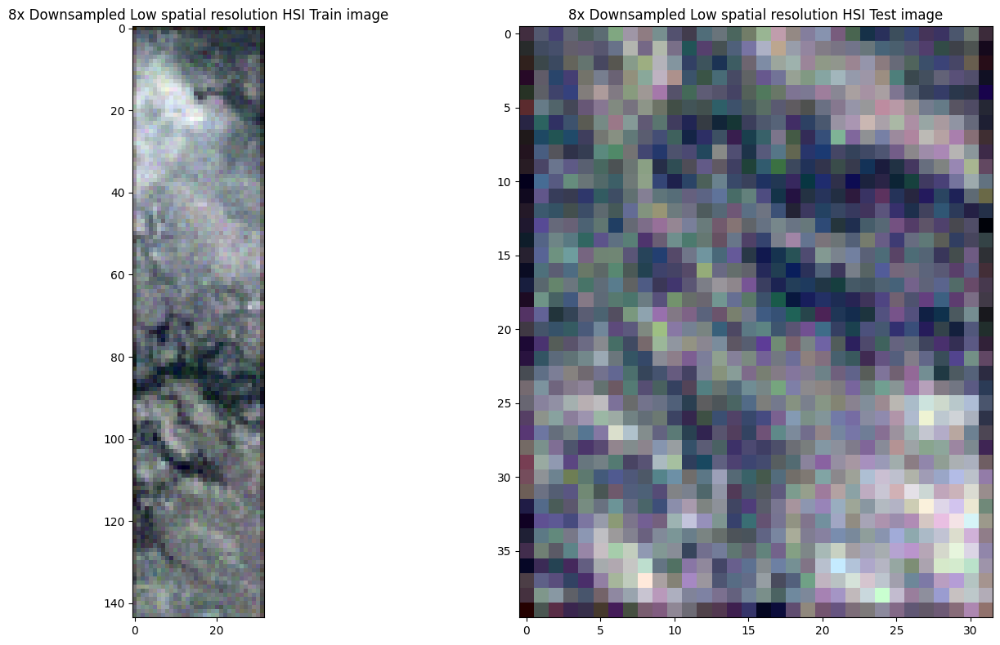

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


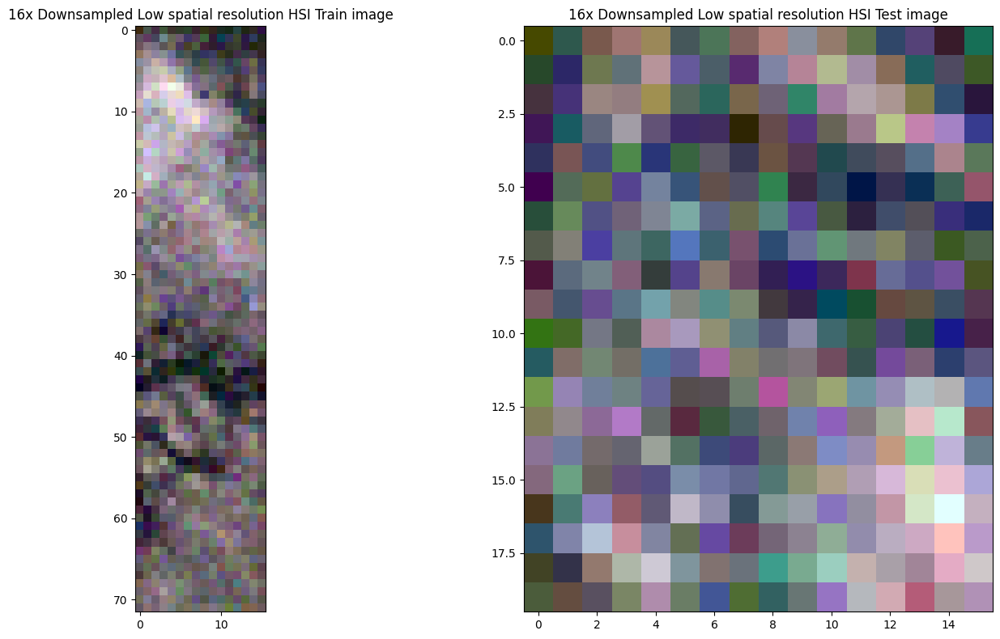

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


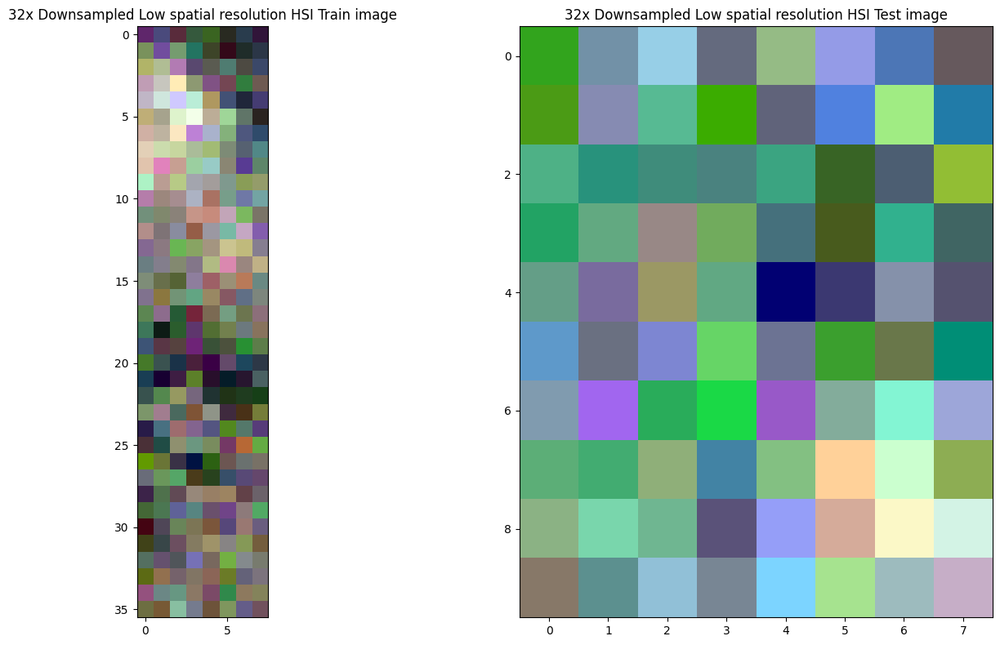

In [17]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_lor_sq = spatial_degradation(botswana_image, lor_sq_psf, 4, 35)
I_HS_4_train_lor_sq, I_HS_4_test_lor_sq = split_lr_hsi(I_HS_4_lor_sq, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_lor_sq.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_lor_sq.shape)
visualize_hsi(I_HS_4_train_lor_sq, I_HS_4_test_lor_sq, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_lor_sq = spatial_degradation(botswana_image, lor_sq_psf, 8, 30)
I_HS_8_train_lor_sq, I_HS_8_test_lor_sq = split_lr_hsi(I_HS_8_lor_sq, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_lor_sq.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_lor_sq.shape)
visualize_hsi(I_HS_8_train_lor_sq, I_HS_8_test_lor_sq, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_lor_sq = spatial_degradation(botswana_image, lor_sq_psf, 16, 25)
I_HS_16_train_lor_sq, I_HS_16_test_lor_sq = split_lr_hsi(I_HS_16_lor_sq, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_lor_sq.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_lor_sq.shape)
visualize_hsi(I_HS_16_train_lor_sq, I_HS_16_test_lor_sq, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_lor_sq = spatial_degradation(botswana_image, lor_sq_psf, 32, 20)
I_HS_32_train_lor_sq, I_HS_32_test_lor_sq = split_lr_hsi(I_HS_32_lor_sq, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_lor_sq.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_lor_sq.shape)
visualize_hsi(I_HS_32_train_lor_sq, I_HS_32_test_lor_sq, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Hermite PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


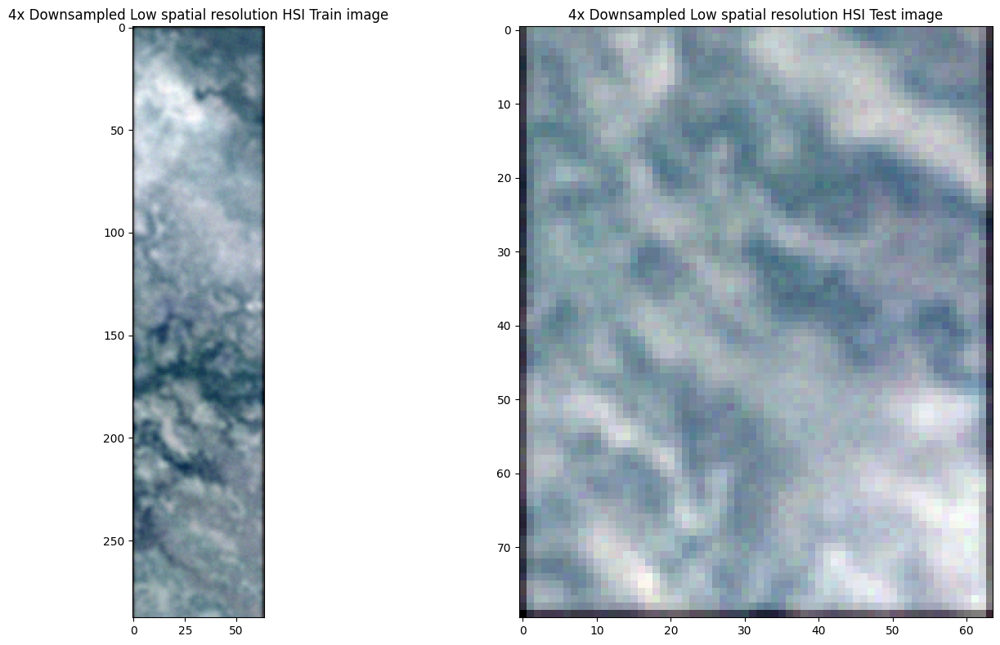

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


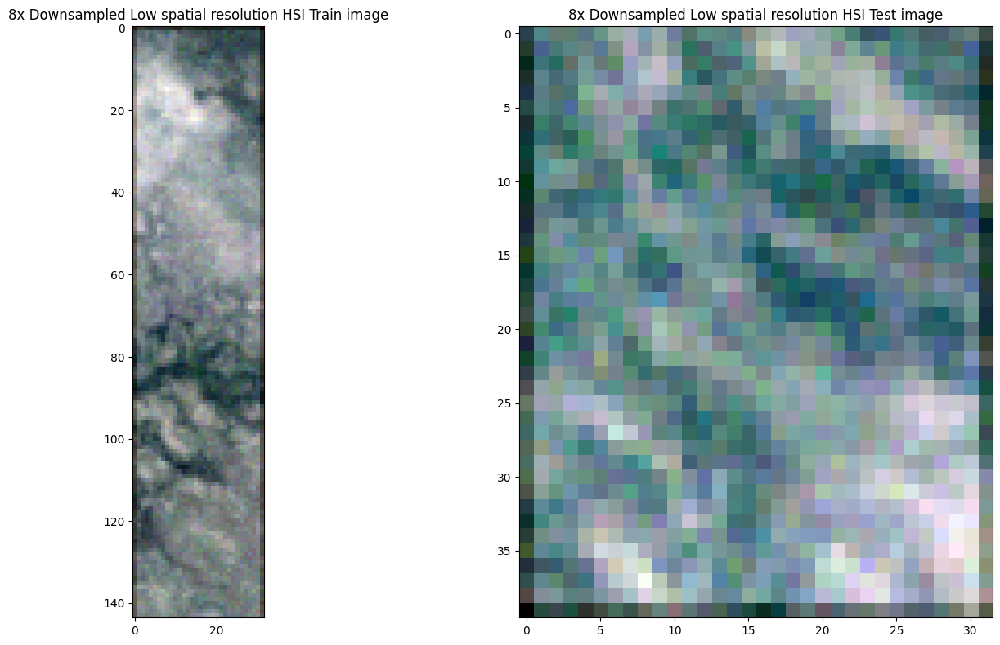

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


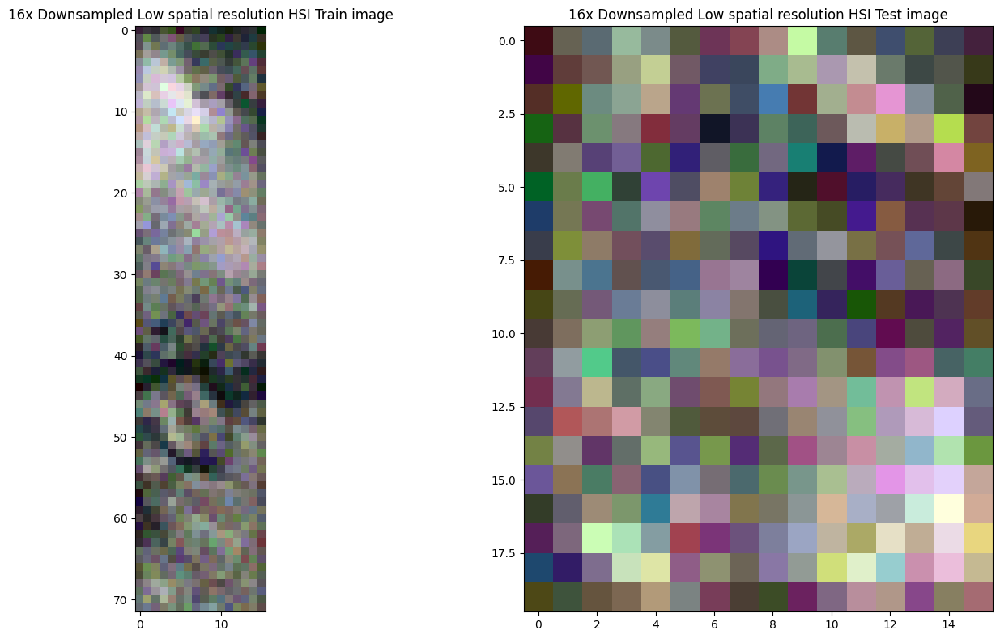

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


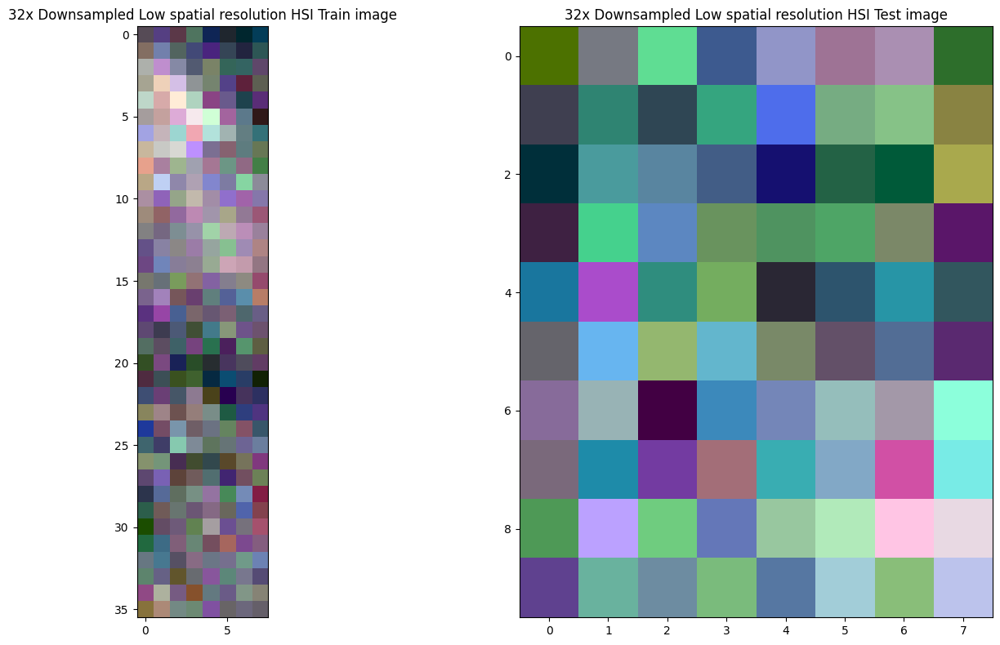

In [18]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_her = spatial_degradation(botswana_image, her_psf, 4, 35)
I_HS_4_train_her, I_HS_4_test_her = split_lr_hsi(I_HS_4_her, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_her.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_her.shape)
visualize_hsi(I_HS_4_train_her, I_HS_4_test_her, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_her = spatial_degradation(botswana_image, her_psf, 8, 30)
I_HS_8_train_her, I_HS_8_test_her = split_lr_hsi(I_HS_8_her, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_her.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_her.shape)
visualize_hsi(I_HS_8_train_her, I_HS_8_test_her, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_her = spatial_degradation(botswana_image, her_psf, 16, 25)
I_HS_16_train_her, I_HS_16_test_her = split_lr_hsi(I_HS_16_her, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_her.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_her.shape)
visualize_hsi(I_HS_16_train_her, I_HS_16_test_her, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_her = spatial_degradation(botswana_image, her_psf, 32, 20)
I_HS_32_train_her, I_HS_32_test_her = split_lr_hsi(I_HS_32_her, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_her.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_her.shape)
visualize_hsi(I_HS_32_train_her, I_HS_32_test_her, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Parabolic PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


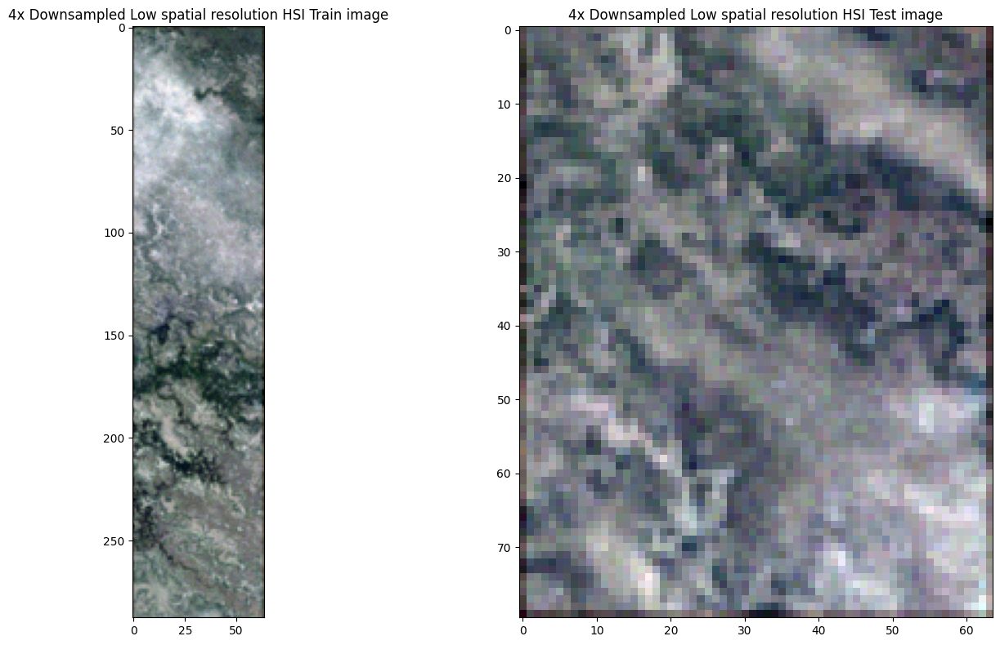

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


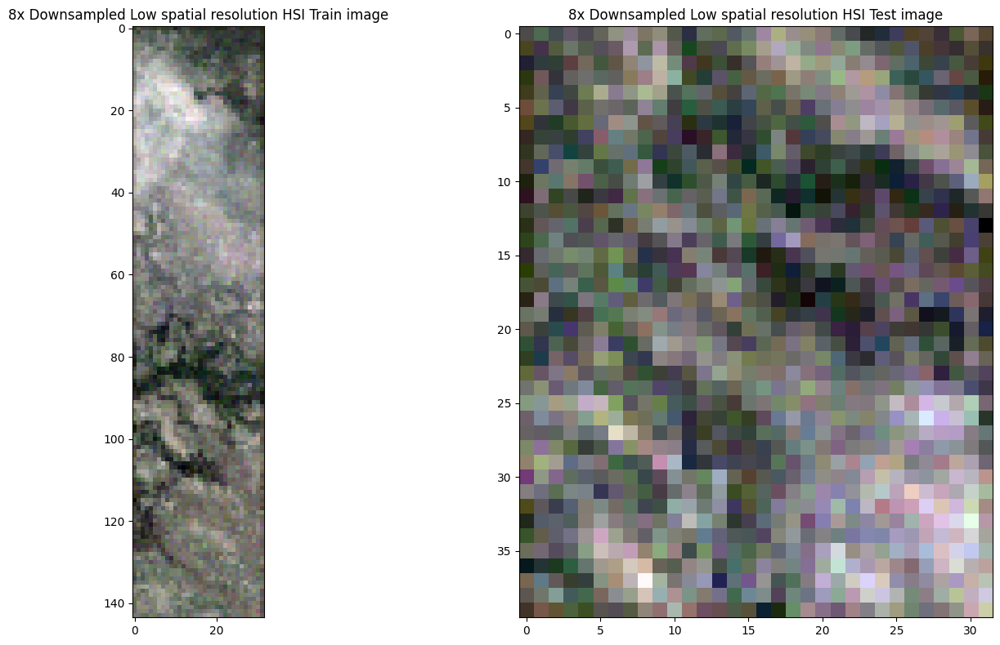

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


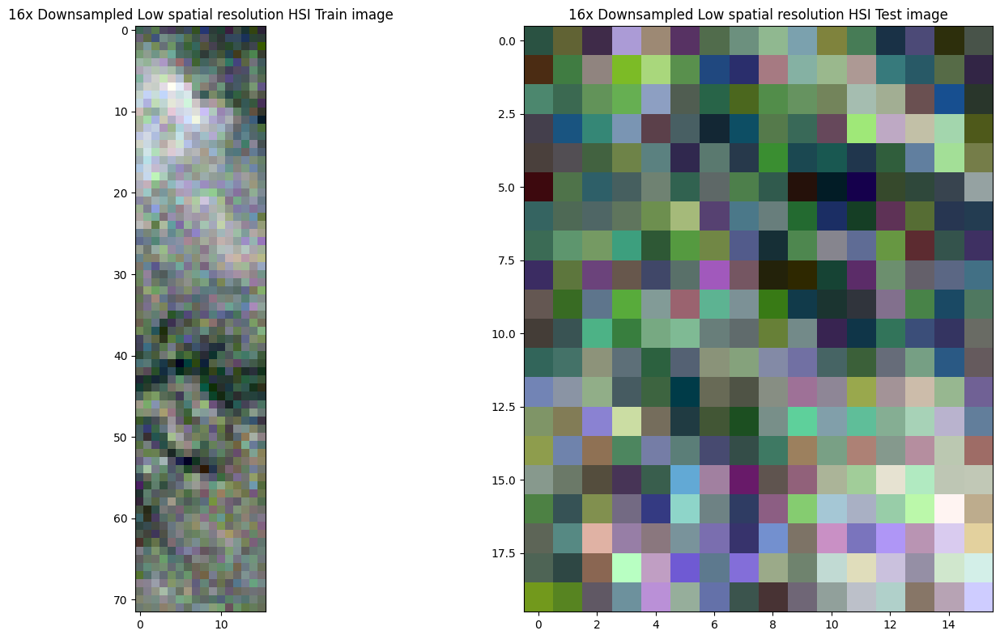

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


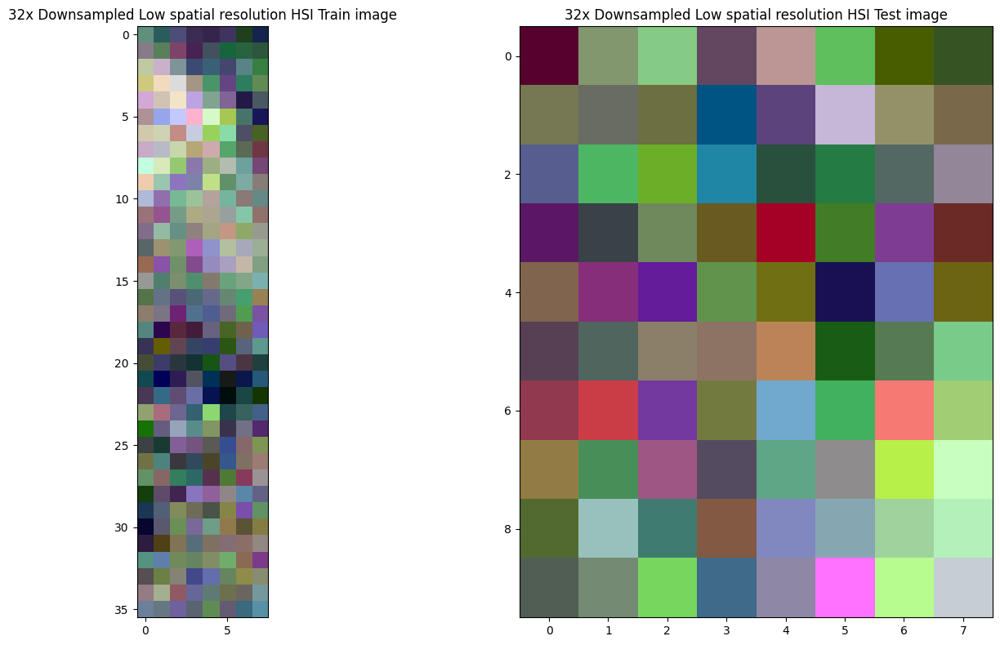

In [12]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_par = spatial_degradation(botswana_image, par_psf, 4, 35)
I_HS_4_train_par, I_HS_4_test_par = split_lr_hsi(I_HS_4_par, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_par.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_par.shape)
visualize_hsi(I_HS_4_train_par, I_HS_4_test_par, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_par = spatial_degradation(botswana_image, par_psf, 8, 30)
I_HS_8_train_par, I_HS_8_test_par = split_lr_hsi(I_HS_8_par, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_par.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_par.shape)
visualize_hsi(I_HS_8_train_par, I_HS_8_test_par, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_par = spatial_degradation(botswana_image, par_psf, 16, 25)
I_HS_16_train_par, I_HS_16_test_par = split_lr_hsi(I_HS_16_par, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_par.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_par.shape)
visualize_hsi(I_HS_16_train_par, I_HS_16_test_par, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_par = spatial_degradation(botswana_image, par_psf, 32, 20)
I_HS_32_train_par, I_HS_32_test_par = split_lr_hsi(I_HS_32_par, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_par.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_par.shape)
visualize_hsi(I_HS_32_train_par, I_HS_32_test_par, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Gabor PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


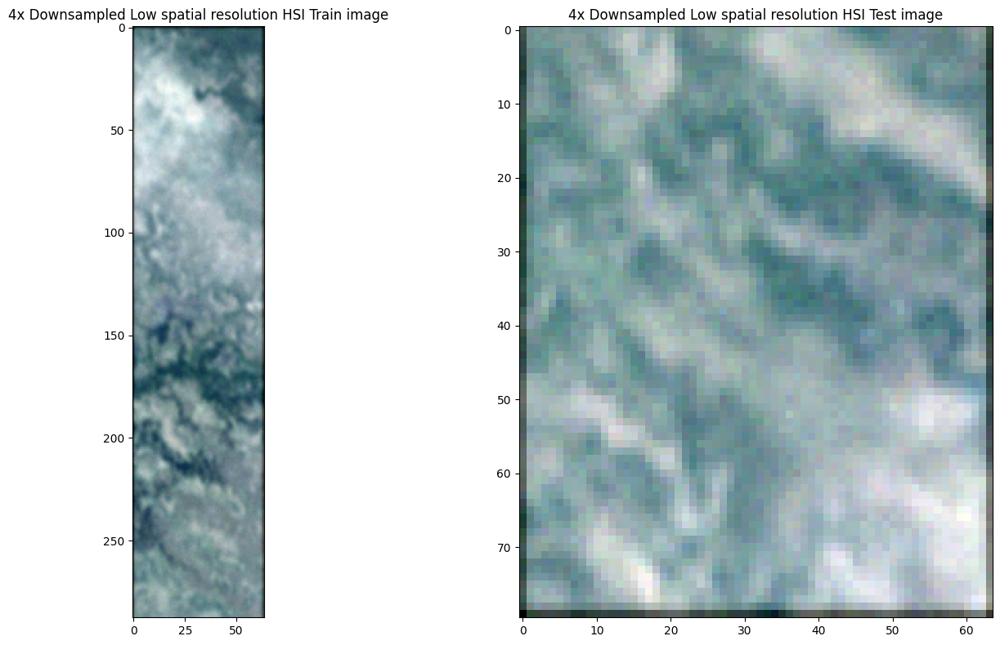

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


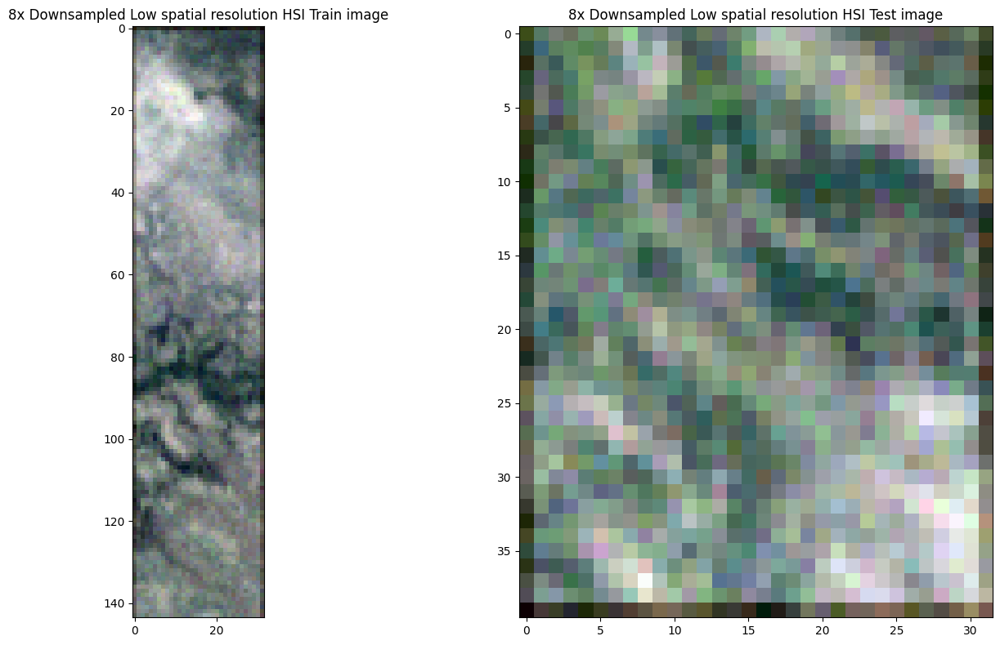

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


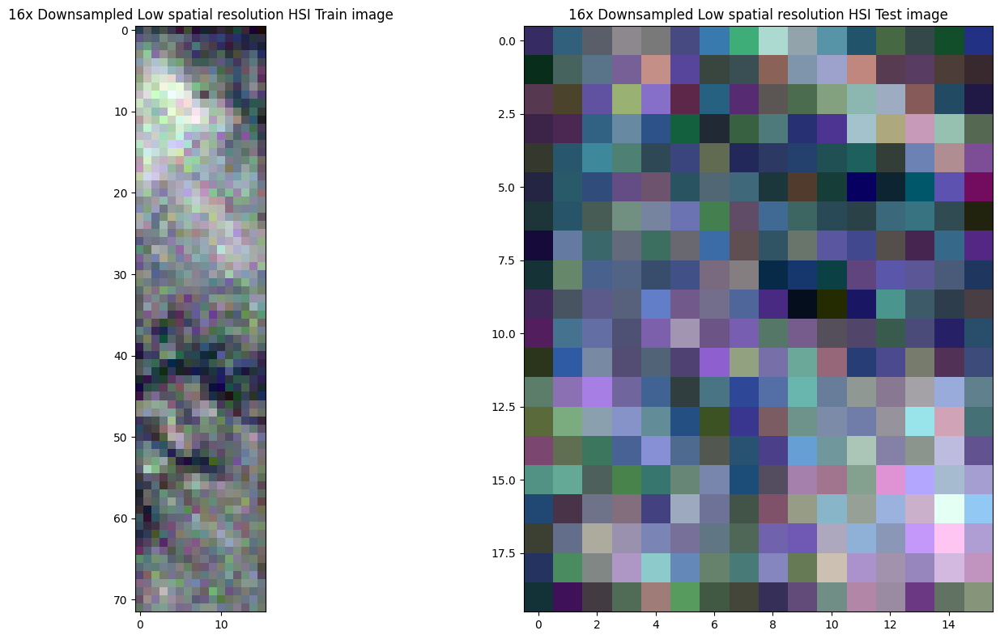

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


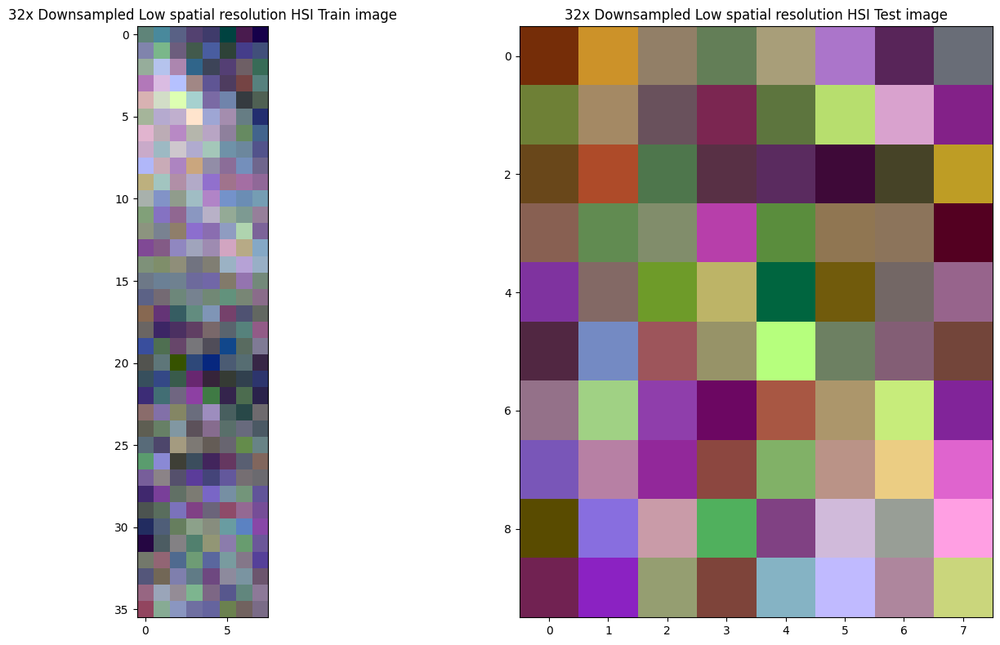

In [13]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_gab = spatial_degradation(botswana_image, gab_psf, 4, 35)
I_HS_4_train_gab, I_HS_4_test_gab = split_lr_hsi(I_HS_4_gab, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_gab.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_gab.shape)
visualize_hsi(I_HS_4_train_gab, I_HS_4_test_gab, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_gab = spatial_degradation(botswana_image, gab_psf, 8, 30)
I_HS_8_train_gab, I_HS_8_test_gab = split_lr_hsi(I_HS_8_gab, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_gab.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_gab.shape)
visualize_hsi(I_HS_8_train_gab, I_HS_8_test_gab, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_gab = spatial_degradation(botswana_image, gab_psf, 16, 25)
I_HS_16_train_gab, I_HS_16_test_gab = split_lr_hsi(I_HS_16_gab, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_gab.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_gab.shape)
visualize_hsi(I_HS_16_train_gab, I_HS_16_test_gab, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_gab = spatial_degradation(botswana_image, gab_psf, 32, 20)
I_HS_32_train_gab, I_HS_32_test_gab = split_lr_hsi(I_HS_32_gab, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_gab.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_gab.shape)
visualize_hsi(I_HS_32_train_gab, I_HS_32_test_gab, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

Setting up and visualizing the HSI images with Delta PSF

HSI train shape with 4x Downsample:  (288, 64, 145)
HSI test shape with 4x Downsample:  (80, 64, 145)


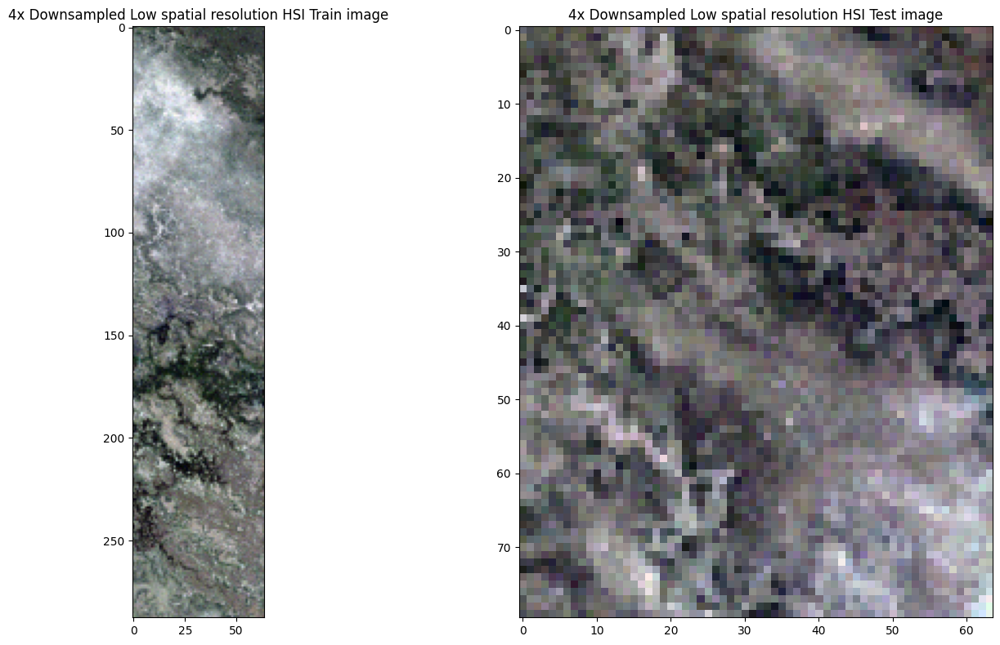

HSI train shape with 8x Downsample:  (144, 32, 145)
HSI test shape with 8x Downsample:  (40, 32, 145)


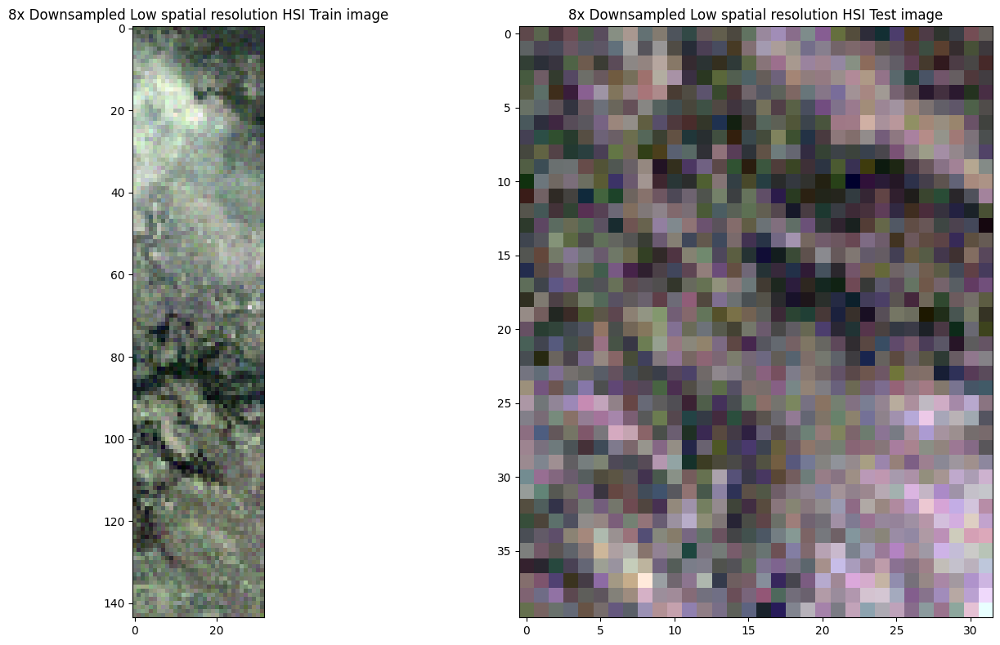

HSI train shape with 16x Downsample:  (72, 16, 145)
HSI test shape with 16x Downsample:  (20, 16, 145)


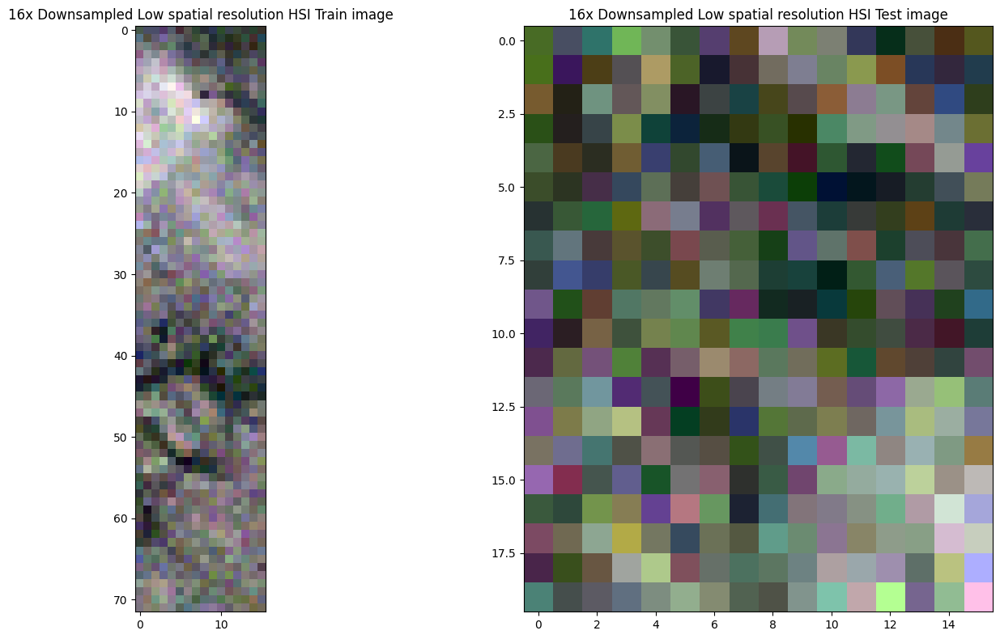

HSI train shape with 32x Downsample:  (36, 8, 145)
HSI test shape with 32x Downsample:  (10, 8, 145)


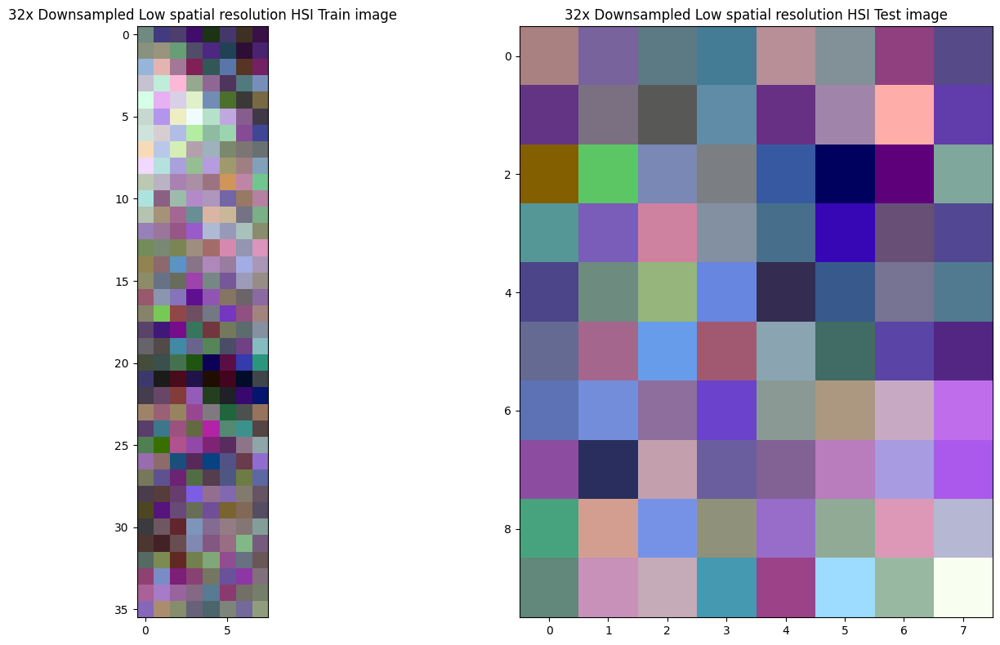

In [14]:
# Low Resolution HSI with 4x downsampling (H/4, W/4, C)
I_HS_4_delta = spatial_degradation(botswana_image, delta_psf, 4, 35)
I_HS_4_train_delta, I_HS_4_test_delta = split_lr_hsi(I_HS_4_delta, downsample_factor=4)
print("HSI train shape with 4x Downsample: ", I_HS_4_train_delta.shape)
print("HSI test shape with 4x Downsample: ", I_HS_4_test_delta.shape)
visualize_hsi(I_HS_4_train_delta, I_HS_4_test_delta, (20, 9, 5), "4x Downsampled Low spatial resolution HSI Train image", "4x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 8x downsampling (H/8, W/8, C)
I_HS_8_delta = spatial_degradation(botswana_image, delta_psf, 8, 30)
I_HS_8_train_delta, I_HS_8_test_delta = split_lr_hsi(I_HS_8_delta, downsample_factor=8)
print("HSI train shape with 8x Downsample: ", I_HS_8_train_delta.shape)
print("HSI test shape with 8x Downsample: ", I_HS_8_test_delta.shape)
visualize_hsi(I_HS_8_train_delta, I_HS_8_test_delta, (20, 9, 5), "8x Downsampled Low spatial resolution HSI Train image", "8x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 16x downsampling (H/16, W/16, C)
I_HS_16_delta = spatial_degradation(botswana_image, delta_psf, 16, 25)
I_HS_16_train_delta, I_HS_16_test_delta = split_lr_hsi(I_HS_16_delta, downsample_factor=16)
print("HSI train shape with 16x Downsample: ", I_HS_16_train_delta.shape)
print("HSI test shape with 16x Downsample: ", I_HS_16_test_delta.shape)
visualize_hsi(I_HS_16_train_delta, I_HS_16_test_delta, (20, 9, 5), "16x Downsampled Low spatial resolution HSI Train image", "16x Downsampled Low spatial resolution HSI Test image")

# Low Resolution HSI with 32x downsampling (H/32, W/32, C)
I_HS_32_delta = spatial_degradation(botswana_image, delta_psf, 32, 20)
I_HS_32_train_delta, I_HS_32_test_delta = split_lr_hsi(I_HS_32_delta, downsample_factor=32)
print("HSI train shape with 32x Downsample: ", I_HS_32_train_delta.shape)
print("HSI test shape with 32x Downsample: ", I_HS_32_test_delta.shape)
visualize_hsi(I_HS_32_train_delta, I_HS_32_test_delta, (20, 9, 5), "32x Downsampled Low spatial resolution HSI Train image", "32x Downsampled Low spatial resolution HSI Test image")

GuidedNet: A General CNN Fusion Framework via High-Resolution Guidance for Hyperspectral Image Super-Resolution implementation from their GitHub

In [15]:
def get_gpu_memory_mb():
    """Returns current GPU memory usage (in MB) for GPU:0 using TensorFlow."""
    mem_info = tf.config.experimental.get_memory_info('GPU:0')
    return mem_info['current'] / (1024 ** 2)  # bytes → MB

In [16]:
def analyze_model_performance_tf(model, sample_inputs):
    """
    Analyze TensorFlow model performance and print:
    - Number of parameters
    - FLOPs
    - GPU memory consumed (in MB)
    - Inference time (in seconds)

    Parameters:
    -----------
    model : tf.keras.Model
        Your model.

    sample_inputs : list of tf.Tensor
        Input tensors to run inference.
    """

    # --- Infer input_signature from sample_inputs ---
    input_signature = [
        tf.TensorSpec(shape=inp.shape, dtype=inp.dtype) for inp in sample_inputs
    ]

    # --- FLOPs ---
    concrete_func = tf.function(model).get_concrete_function(*input_signature)
    frozen_func = convert_variables_to_constants_v2(concrete_func)
    graph_def = frozen_func.graph.as_graph_def()

    # Suppress stdout temporarily to hide profiler spam
    original_stdout = sys.stdout
    sys.stdout = iot.StringIO()

    try:
        with tf.Graph().as_default() as graph:
            tf.compat.v1.import_graph_def(graph_def, name='')
            run_meta = tf.compat.v1.RunMetadata()
            opts = tf.compat.v1.profiler.ProfileOptionBuilder.float_operation()
            opts['output'] = 'none'

            flops = tf.compat.v1.profiler.profile(
                graph=graph,
                run_meta=run_meta,
                options=opts
            ).total_float_ops
    finally:
        sys.stdout = original_stdout

    # --- Parameters ---
    num_params = np.sum([np.prod(v.shape) for v in model.trainable_variables])
    start_mem = get_gpu_memory_mb()

    # --- Inference Time ---
    start = time.time()
    _ = model(*sample_inputs, training=False)
    end = time.time()
    inference_time_sec = end - start

    # --- GPU Memory consumed at inference---
    end_mem = get_gpu_memory_mb()
    mem_used = end_mem - start_mem

    # --- Print Results ---
    print(f"Number of parameters: {num_params:,}")
    print(f"FLOPs: {flops:,}")
    print(f"GPU Memory:      {mem_used:.2f} MB")
    print(f"Inference time: {inference_time_sec:.4f} seconds")

In [17]:
class Subpixel2D(tf.keras.layers.Layer):
    """
    Subpixel upsampling using tf.nn.depth_to_space.
    Expects last dimension = (channels * (block_size^2)).
    """
    def __init__(self, block_size=2, **kwargs):
        super().__init__(**kwargs)
        self.block_size = block_size

    def call(self, inputs):
        # inputs: (batch, h, w, c * block_size^2)
        return tf.nn.depth_to_space(inputs, self.block_size)


class HyNetSingleLevel(tf.keras.layers.Layer):
    """
    One scale level: upsamples net_feature by 2×, merges with MSI,
    does residual blocks, then upsamples net_image by 2× + gradient correction.
    """
    def __init__(self, hs_bands=31, res_number=10, **kwargs):
        super().__init__(**kwargs)
        self.hs_bands = hs_bands
        self.res_number = res_number

        # Feature upsampling (Conv2DTranspose with stride=2)
        self.deconv_feature = tf.keras.layers.Conv2DTranspose(
            filters=64, kernel_size=6, strides=2, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Merge Convs after concat
        self.merge_conv1 = tf.keras.layers.Conv2D(
            filters=64, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )
        self.merge_conv2 = tf.keras.layers.Conv2D(
            filters=64, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Residual blocks
        self.residual_convs = []
        for _ in range(res_number):
            conv = tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, padding='same',
                kernel_initializer=tf.keras.initializers.GlorotUniform()
            )
            self.residual_convs.append(conv)

        # Gradient conv => produce "hs_bands" channels
        self.gradient_conv = tf.keras.layers.Conv2D(
            filters=self.hs_bands, kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )

        # Upsample net_image => use subpixel
        self.upconv_image = tf.keras.layers.Conv2D(
            filters=self.hs_bands * 4,  # subpixel x2 => *4
            kernel_size=3, padding='same',
            kernel_initializer=tf.keras.initializers.GlorotUniform()
        )
        self.subpixel_image = Subpixel2D(block_size=2)

    def call(self, net_image, net_feature, msi_downsample, training=None):
        """
        net_image:   (B, h, w, hs_bands)
        net_feature: (B, h, w, 64)
        msi_downsample: (B, h, w, ???)  # MSI at same scale as net_feature
        """
        # 1) Upsample net_feature by 2×
        net_feature_up = self.deconv_feature(net_feature, training=training)
        # 2) Concatenate with MSI
        concat = tf.concat([net_feature_up, msi_downsample], axis=-1)
        # 3) Merge conv
        x = self.merge_conv1(concat, training=training)
        x = self.merge_conv2(x, training=training)
        # 4) Residual blocks
        for conv in self.residual_convs:
            tmp = tf.nn.leaky_relu(x)
            tmp = conv(tmp, training=training)
            x = x + tmp
        net_feature_out = x

        # 5) Gradient in HSI domain
        gradient_level = self.gradient_conv(x, training=training)

        # 6) Upsample net_image by 2 using subpixel
        net_image_conv = self.upconv_image(net_image, training=training)
        net_image_up = self.subpixel_image(net_image_conv)

        # 7) Add gradient
        net_image_up = net_image_up + gradient_level

        return net_image_up, net_feature_out


class MultiScaleHyNet(tf.keras.Model):
    def __init__(self, hs_bands=31, msi_channels=4, res_number=10, scale_factor=8):
        super().__init__()
        self.num_levels = int(math.log2(scale_factor))

        # Initial convs
        self.init_conv1 = tf.keras.layers.Conv2D(64, 3, padding='same')
        self.init_conv2 = tf.keras.layers.Conv2D(64, 3, padding='same')

        # HyNetSingleLevel blocks
        self.levels = []
        for _ in range(self.num_levels):
            self.levels.append(HyNetSingleLevel(hs_bands=hs_bands, res_number=res_number))

        # Downsamplers
        self.msi_downs = []
        for _ in range(self.num_levels):
            self.msi_downs.append(
                tf.keras.layers.Conv2D(msi_channels, 6, strides=2, padding='same')
            )

    def call(self, lr_hsi, hr_msi, training=None):
        # 1) Feature extraction
        net_feature = self.init_conv1(lr_hsi, training=training)
        net_feature = self.init_conv2(net_feature, training=training)
        net_image   = lr_hsi

        # 2) We store [8×, 4×, 2×, 1×] in msi_scales if scale_factor=8
        msi_scales = [hr_msi]
        temp = hr_msi
        for down in self.msi_downs: 
            temp = down(temp, training=training)
            msi_scales.append(temp)

        # Reverse them so now we have [1×, 2×, 4×, 8×]
        msi_scales.reverse()

        # 3) Now do each level:
        #    First level => up from 1× to 2× => feed the 2× MSI,
        #    second => from 2× to 4× => feed the 4× MSI, etc.
        outputs = []
        for i, level in enumerate(self.levels):
            # i=0 => net_image is 1× => after the block => 2×
            # we want msi_scales[1], which is 2×
            msi_for_level = msi_scales[i+1]
            net_image, net_feature = level(net_image, net_feature, msi_for_level, training=training)
            outputs.append(net_image)

        return outputs

Output file to save super-resolved images

In [18]:
# Get the current working directory
notebook_directory = os.getcwd()

# Define the relative path to the target directory
target_relative_path = "../../../Super_Resolved_Images_From_Comparison_Implementations/GuidedNet"

# Construct the full path to the target directory
target_path = os.path.join(notebook_directory, target_relative_path)

# Normalize the path to remove redundancies
normalized_target_path = os.path.normpath(target_path)

# Define the path to the folder
botswana_guidednet_folder_path = os.path.join(normalized_target_path, 'Botswana')

# Create the folder if it doesn't exist
if not os.path.exists(botswana_guidednet_folder_path):
    os.makedirs(botswana_guidednet_folder_path)

## Super Resolving HSI degraded with Gaussian PSF

In [26]:
# Creating sub folder within which to save the super resolved images from Gaussian PSF degraded HSI
botswana_guided_net_gaus_folder_path = os.path.join(botswana_guidednet_folder_path, 'Gaussian_PSF')

# Create the Gaussian sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_gaus_folder_path):
    os.makedirs(botswana_guided_net_gaus_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [27]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749799723.092911  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749799723.135642  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749799723.140866  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749799723.702373  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749799723.788231  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  382.03 seconds
Training complete!


I0000 00:00:1749800098.392514  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0375 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [28]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749800108.506288  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800108.518197  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800108.528611  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800108.607027  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800108.614570  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  426.07 seconds
Training complete!


I0000 00:00:1749800525.988598  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      60.39 MB
Inference time: 0.0547 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [29]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749800539.098120  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800539.103360  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800539.118376  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800539.121974  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749800539.125124  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  460.07 seconds
Training complete!


I0000 00:00:1749800987.967581  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      90.46 MB
Inference time: 0.0730 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [30]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_gaus)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_gaus)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749801004.575052  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801004.579985  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801004.738803  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801004.743226  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801004.746182  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  484.42 seconds
Training complete!


I0000 00:00:1749801475.082183  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      68.42 MB
Inference time: 0.0887 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [31]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749801486.425715  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801486.446808  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801486.454868  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801486.460591  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801486.466329  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  427.48 seconds
Training complete!


I0000 00:00:1749801904.931262  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      67.11 MB
Inference time: 0.0550 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [32]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749801915.113660  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801915.118721  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801915.126661  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801915.132286  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749801915.137901  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  426.70 seconds
Training complete!


I0000 00:00:1749802333.404730  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      60.02 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [33]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749802344.331522  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802344.337891  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802344.345561  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802344.351182  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802344.356918  978356 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  426.02 seconds
Training complete!


I0000 00:00:1749802761.168855  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      59.47 MB
Inference time: 0.0634 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_gaus_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [34]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gaus)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gaus)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gaus_folder_path}/SR_Botswana_gaussian_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_gaus_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749802771.356755  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802771.363877  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802771.371154  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802771.376666  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749802771.382384  978355 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  426.28 seconds
Training complete!


I0000 00:00:1749803189.232589  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      86.65 MB
Inference time: 0.0555 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_gaus_folder_path


## Super Resolving HSI degraded with Kolmogorov PSF

In [35]:
# Creating sub folder within which to save the super resolved images from Kolmogorov PSF degraded HSI
botswana_guided_net_kol_folder_path = os.path.join(botswana_guidednet_folder_path, 'Kolmogorov_PSF')

# Create the Kolmogorov sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_kol_folder_path):
    os.makedirs(botswana_guided_net_kol_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [36]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_8/conv2d_437/kernel', 'multi_scale_hy_net_8/conv2d_437/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:21<00:00, 13.10it/s, loss=0.038582]


Training completed in  381.62 seconds
Training complete!


I0000 00:00:1749803572.512580  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0378 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [37]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_9/conv2d_484/kernel', 'multi_scale_hy_net_9/conv2d_484/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:05<00:00, 11.74it/s, loss=0.119344] 


Training completed in  425.87 seconds
Training complete!


I0000 00:00:1749803999.831259  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      63.78 MB
Inference time: 0.0545 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [38]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_10/conv2d_546/kernel', 'multi_scale_hy_net_10/conv2d_546/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:41<00:00, 10.83it/s, loss=0.327933]  


Training completed in  461.50 seconds
Training complete!


I0000 00:00:1749804463.132595  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      61.99 MB
Inference time: 0.0717 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [39]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_kol)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_kol)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_11/conv2d_623/kernel', 'multi_scale_hy_net_11/conv2d_623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:19<00:00, 10.01it/s, loss=0.659225]   


Training completed in  499.49 seconds
Training complete!


I0000 00:00:1749804964.853618  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      60.46 MB
Inference time: 0.0922 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [40]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_12/conv2d_670/kernel', 'multi_scale_hy_net_12/conv2d_670/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:14<00:00, 11.51it/s, loss=0.136332] 


Training completed in  434.32 seconds
Training complete!


I0000 00:00:1749805401.563202  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      60.40 MB
Inference time: 0.0566 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [41]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_13/conv2d_717/kernel', 'multi_scale_hy_net_13/conv2d_717/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.59it/s, loss=0.129052]  


Training completed in  431.50 seconds
Training complete!


I0000 00:00:1749805834.866722  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      79.75 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [42]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_14/conv2d_764/kernel', 'multi_scale_hy_net_14/conv2d_764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:10<00:00, 11.62it/s, loss=0.106214] 


Training completed in  430.40 seconds
Training complete!


I0000 00:00:1749806267.025343  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      59.47 MB
Inference time: 0.0566 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_kol_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [43]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_kol)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_kol)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_kol_folder_path}/SR_Botswana_kolmogorov_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_kol_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_15/conv2d_811/kernel', 'multi_scale_hy_net_15/conv2d_811/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.54it/s, loss=0.113114]  


Training completed in  433.16 seconds
Training complete!


I0000 00:00:1749806701.949980  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      81.96 MB
Inference time: 0.0566 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_kol_folder_path


## Super Resolving HSI degraded with Airy PSF

In [44]:
# Creating sub folder within which to save the super resolved images from Airy PSF degraded HSI
botswana_guided_net_air_folder_path = os.path.join(botswana_guidednet_folder_path, 'Airy_PSF')

# Create the Airy sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_air_folder_path):
    os.makedirs(botswana_guided_net_air_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [45]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_16/conv2d_843/kernel', 'multi_scale_hy_net_16/conv2d_843/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:26<00:00, 12.95it/s, loss=0.036414]


Training completed in  386.17 seconds
Training complete!


I0000 00:00:1749807089.811379  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0389 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [46]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_17/conv2d_890/kernel', 'multi_scale_hy_net_17/conv2d_890/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:09<00:00, 11.64it/s, loss=0.121800] 


Training completed in  429.65 seconds
Training complete!


I0000 00:00:1749807520.914259  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      70.52 MB
Inference time: 0.0559 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [47]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_18/conv2d_952/kernel', 'multi_scale_hy_net_18/conv2d_952/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:47<00:00, 10.69it/s, loss=0.309050]  


Training completed in  467.85 seconds
Training complete!


I0000 00:00:1749807990.647501  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      73.06 MB
Inference time: 0.0754 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [48]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_air)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_air)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_19/conv2d_1029/kernel', 'multi_scale_hy_net_19/conv2d_1029/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:23<00:00,  9.93it/s, loss=0.737849]   


Training completed in  503.34 seconds
Training complete!


I0000 00:00:1749808498.109529  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      62.06 MB
Inference time: 0.0906 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [49]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_20/conv2d_1076/kernel', 'multi_scale_hy_net_20/conv2d_1076/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:12<00:00, 11.57it/s, loss=0.141806] 


Training completed in  432.32 seconds
Training complete!


I0000 00:00:1749808932.688364  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      95.22 MB
Inference time: 0.0554 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [50]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_21/conv2d_1123/kernel', 'multi_scale_hy_net_21/conv2d_1123/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.53it/s, loss=0.129550]  


Training completed in  433.67 seconds
Training complete!


I0000 00:00:1749809368.157640  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      75.46 MB
Inference time: 0.0567 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [51]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_22/conv2d_1170/kernel', 'multi_scale_hy_net_22/conv2d_1170/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.59it/s, loss=0.121024]  


Training completed in  431.54 seconds
Training complete!


I0000 00:00:1749809801.462037  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      61.10 MB
Inference time: 0.0559 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_air_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [52]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_air)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_air)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_air_folder_path}/SR_Botswana_airy_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_air_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_23/conv2d_1217/kernel', 'multi_scale_hy_net_23/conv2d_1217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.59it/s, loss=0.117907]  


Training completed in  431.60 seconds
Training complete!


I0000 00:00:1749810234.835883  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      59.47 MB
Inference time: 0.0556 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_air_folder_path


## Super Resolving HSI degraded with Moffat PSF

In [53]:
# Creating sub folder within which to save the super resolved images from Moffat PSF degraded HSI
botswana_guided_net_mof_folder_path = os.path.join(botswana_guidednet_folder_path, 'Moffat_PSF')

# Create the Moffat sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_mof_folder_path):
    os.makedirs(botswana_guided_net_mof_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [54]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_24/conv2d_1249/kernel', 'multi_scale_hy_net_24/conv2d_1249/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:27<00:00, 12.90it/s, loss=0.038560]


Training completed in  387.68 seconds
Training complete!


I0000 00:00:1749810624.186334  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0385 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [55]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_25/conv2d_1296/kernel', 'multi_scale_hy_net_25/conv2d_1296/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.60it/s, loss=0.115875] 


Training completed in  431.17 seconds
Training complete!


I0000 00:00:1749811056.855821  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      60.46 MB
Inference time: 0.0563 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [56]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_26/conv2d_1358/kernel', 'multi_scale_hy_net_26/conv2d_1358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:47<00:00, 10.69it/s, loss=0.327890]  


Training completed in  467.95 seconds
Training complete!


I0000 00:00:1749811526.752082  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      105.21 MB
Inference time: 0.0731 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [57]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_mof)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_mof)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_27/conv2d_1435/kernel', 'multi_scale_hy_net_27/conv2d_1435/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:24<00:00,  9.90it/s, loss=0.683646]   


Training completed in  504.82 seconds
Training complete!


I0000 00:00:1749812033.892497  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      63.35 MB
Inference time: 0.0914 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [58]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_28/conv2d_1482/kernel', 'multi_scale_hy_net_28/conv2d_1482/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:10<00:00, 11.62it/s, loss=0.150754]  


Training completed in  430.48 seconds
Training complete!


I0000 00:00:1749812466.689739  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      61.17 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [59]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_29/conv2d_1529/kernel', 'multi_scale_hy_net_29/conv2d_1529/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:10<00:00, 11.60it/s, loss=0.135858]  


Training completed in  430.96 seconds
Training complete!


I0000 00:00:1749812899.401207  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      69.75 MB
Inference time: 0.0568 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [60]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_30/conv2d_1576/kernel', 'multi_scale_hy_net_30/conv2d_1576/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:09<00:00, 11.65it/s, loss=0.119371]  


Training completed in  429.17 seconds
Training complete!


I0000 00:00:1749813330.279328  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      70.64 MB
Inference time: 0.0566 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_mof_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [61]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_mof)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_mof)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_mof_folder_path}/SR_Botswana_moffat_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_mof_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_31/conv2d_1623/kernel', 'multi_scale_hy_net_31/conv2d_1623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:10<00:00, 11.60it/s, loss=0.113165]  


Training completed in  430.85 seconds
Training complete!


I0000 00:00:1749813762.977691  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      59.87 MB
Inference time: 0.0567 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_mof_folder_path


## Super Resolving HSI degraded with Sinc PSF

In [62]:
# Creating sub folder within which to save the super resolved images from Sinc PSF degraded HSI
botswana_guided_net_sinc_folder_path = os.path.join(botswana_guidednet_folder_path, 'Sinc_PSF')

# Create the Sinc sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_sinc_folder_path):
    os.makedirs(botswana_guided_net_sinc_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [63]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_32/conv2d_1655/kernel', 'multi_scale_hy_net_32/conv2d_1655/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:28<00:00, 12.86it/s, loss=0.037217]


Training completed in  388.74 seconds
Training complete!


I0000 00:00:1749814156.788920  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      60.54 MB
Inference time: 0.0385 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [64]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_33/conv2d_1702/kernel', 'multi_scale_hy_net_33/conv2d_1702/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:12<00:00, 11.57it/s, loss=0.126397] 


Training completed in  432.33 seconds
Training complete!


I0000 00:00:1749814590.823465  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      67.97 MB
Inference time: 0.0565 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [65]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_34/conv2d_1764/kernel', 'multi_scale_hy_net_34/conv2d_1764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:48<00:00, 10.68it/s, loss=0.312508]  


Training completed in  468.25 seconds
Training complete!


I0000 00:00:1749815060.969732  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      85.26 MB
Inference time: 0.0745 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [66]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_sinc)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_sinc)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_35/conv2d_1841/kernel', 'multi_scale_hy_net_35/conv2d_1841/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:22<00:00,  9.96it/s, loss=0.668825]   


Training completed in  502.02 seconds
Training complete!


I0000 00:00:1749815565.353492  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      64.53 MB
Inference time: 0.0921 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [67]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_36/conv2d_1888/kernel', 'multi_scale_hy_net_36/conv2d_1888/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.58it/s, loss=0.162446]  


Training completed in  431.83 seconds
Training complete!


I0000 00:00:1749815999.597375  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      59.47 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [68]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_37/conv2d_1935/kernel', 'multi_scale_hy_net_37/conv2d_1935/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.59it/s, loss=0.119156] 


Training completed in  431.27 seconds
Training complete!


I0000 00:00:1749816432.605973  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      69.45 MB
Inference time: 0.0564 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [69]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_38/conv2d_1982/kernel', 'multi_scale_hy_net_38/conv2d_1982/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.48it/s, loss=0.119462]  


Training completed in  435.64 seconds
Training complete!


I0000 00:00:1749816870.105793  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      69.50 MB
Inference time: 0.0574 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_sinc_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [70]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_sinc)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_sinc)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_sinc_folder_path}/SR_Botswana_sinc_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_sinc_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_39/conv2d_2029/kernel', 'multi_scale_hy_net_39/conv2d_2029/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.54it/s, loss=0.116149]  


Training completed in  433.11 seconds
Training complete!


I0000 00:00:1749817305.019942  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      61.45 MB
Inference time: 0.0571 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_sinc_folder_path


## Super Resolving HSI degraded with Lorentzian Squared PSF

In [71]:
# Creating sub folder within which to save the super resolved images from Lorentzian Squared PSF degraded HSI
botswana_guided_net_lor_sq_folder_path = os.path.join(botswana_guidednet_folder_path, 'Lorentzian_Squared_PSF')

# Create the Lorentzian Squared sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_lor_sq_folder_path):
    os.makedirs(botswana_guided_net_lor_sq_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [72]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_40/conv2d_2061/kernel', 'multi_scale_hy_net_40/conv2d_2061/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:28<00:00, 12.86it/s, loss=0.040885]


Training completed in  388.76 seconds
Training complete!


I0000 00:00:1749817695.476715  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      60.68 MB
Inference time: 0.0388 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [73]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_41/conv2d_2108/kernel', 'multi_scale_hy_net_41/conv2d_2108/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:10<00:00, 11.63it/s, loss=0.119401] 


Training completed in  430.08 seconds
Training complete!


I0000 00:00:1749818127.011252  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      71.33 MB
Inference time: 0.0554 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [74]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_42/conv2d_2170/kernel', 'multi_scale_hy_net_42/conv2d_2170/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:41<00:00, 10.84it/s, loss=0.300245]  


Training completed in  461.26 seconds
Training complete!


I0000 00:00:1749818590.092478  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      60.60 MB
Inference time: 0.0731 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [75]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_43/conv2d_2247/kernel', 'multi_scale_hy_net_43/conv2d_2247/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:21<00:00,  9.97it/s, loss=0.686586]   


Training completed in  501.33 seconds
Training complete!


I0000 00:00:1749819093.779829  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      65.41 MB
Inference time: 0.0920 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [76]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_44/conv2d_2294/kernel', 'multi_scale_hy_net_44/conv2d_2294/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.58it/s, loss=0.142910] 


Training completed in  431.61 seconds
Training complete!


I0000 00:00:1749819527.954815  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      65.70 MB
Inference time: 0.0565 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [77]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_45/conv2d_2341/kernel', 'multi_scale_hy_net_45/conv2d_2341/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:16<00:00, 11.45it/s, loss=0.125913] 


Training completed in  436.78 seconds
Training complete!


I0000 00:00:1749819966.670682  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      59.47 MB
Inference time: 0.0562 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [78]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_46/conv2d_2388/kernel', 'multi_scale_hy_net_46/conv2d_2388/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:19<00:00, 11.38it/s, loss=0.117117]  


Training completed in  439.51 seconds
Training complete!


I0000 00:00:1749820408.275154  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      68.09 MB
Inference time: 0.0558 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [79]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_lor_sq)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_lor_sq)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_lor_sq_folder_path}/SR_Botswana_lorentzian_squared_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_lor_sq_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_47/conv2d_2435/kernel', 'multi_scale_hy_net_47/conv2d_2435/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.54it/s, loss=0.105264] 


Training completed in  433.34 seconds
Training complete!


I0000 00:00:1749820843.563187  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      77.82 MB
Inference time: 0.0565 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_lor_sq_folder_path


## Super Resolving HSI degraded with Hermite PSF

In [80]:
# Creating sub folder within which to save the super resolved images from Hermite PSF degraded HSI
botswana_guided_net_her_folder_path = os.path.join(botswana_guidednet_folder_path, 'Hermite_PSF')

# Create the Hermite sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_her_folder_path):
    os.makedirs(botswana_guided_net_her_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [81]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_48/conv2d_2467/kernel', 'multi_scale_hy_net_48/conv2d_2467/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:27<00:00, 12.89it/s, loss=0.038137]


Training completed in  387.94 seconds
Training complete!


I0000 00:00:1749821233.197698  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      91.39 MB
Inference time: 0.0388 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [82]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_49/conv2d_2514/kernel', 'multi_scale_hy_net_49/conv2d_2514/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.58it/s, loss=0.124863]  


Training completed in  431.84 seconds
Training complete!


I0000 00:00:1749821666.537355  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      61.18 MB
Inference time: 0.0565 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [83]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_50/conv2d_2576/kernel', 'multi_scale_hy_net_50/conv2d_2576/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:47<00:00, 10.70it/s, loss=0.316932]  


Training completed in  467.23 seconds
Training complete!


I0000 00:00:1749822135.665603  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      61.23 MB
Inference time: 0.0741 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [84]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_her)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_her)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_51/conv2d_2653/kernel', 'multi_scale_hy_net_51/conv2d_2653/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:24<00:00,  9.92it/s, loss=0.678839]   


Training completed in  504.09 seconds
Training complete!


I0000 00:00:1749822641.930565  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      62.26 MB
Inference time: 0.0914 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [85]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_52/conv2d_2700/kernel', 'multi_scale_hy_net_52/conv2d_2700/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:11<00:00, 11.59it/s, loss=0.153965]  


Training completed in  431.48 seconds
Training complete!


I0000 00:00:1749823075.781979  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      84.41 MB
Inference time: 0.0562 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [86]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_53/conv2d_2747/kernel', 'multi_scale_hy_net_53/conv2d_2747/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:12<00:00, 11.57it/s, loss=0.125575] 


Training completed in  432.11 seconds
Training complete!


I0000 00:00:1749823509.739682  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      68.17 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [87]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_54/conv2d_2794/kernel', 'multi_scale_hy_net_54/conv2d_2794/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:09<00:00, 11.63it/s, loss=0.115680] 


Training completed in  429.92 seconds
Training complete!


I0000 00:00:1749823941.575536  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      59.47 MB
Inference time: 0.0557 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_her_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [88]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_her)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_her)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_her_folder_path}/SR_Botswana_hermite_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_her_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_55/conv2d_2841/kernel', 'multi_scale_hy_net_55/conv2d_2841/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.48it/s, loss=0.117203]  


Training completed in  435.57 seconds
Training complete!


I0000 00:00:1749824379.154647  977393 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      63.14 MB
Inference time: 0.0567 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_her_folder_path


## Super Resolving HSI degraded with Parabolic PSF

In [19]:
# Creating sub folder within which to save the super resolved images from Parabolic PSF degraded HSI
botswana_guided_net_par_folder_path = os.path.join(botswana_guidednet_folder_path, 'Parabolic_PSF')

# Create the Parabolic sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_par_folder_path):
    os.makedirs(botswana_guided_net_par_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [20]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net/conv2d_31/kernel', 'multi_scale_hy_net/conv2d_31/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749884695.114186 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749884695.211760 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749884695.217373 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749884695.593870 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749884695.687747 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accura

Training completed in  386.65 seconds
Training complete!


I0000 00:00:1749885074.769459 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Instructions for updating:
This API was designed for TensorFlow v1. See https://www.tensorflow.org/guide/migrate for instructions on how to migrate your code to TensorFlow v2.
Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0375 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [21]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_1/conv2d_78/kernel', 'multi_scale_hy_net_1/conv2d_78/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749885085.180552 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885085.190836 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885085.194947 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885085.199411 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885085.261531 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement ac

Training completed in  434.65 seconds
Training complete!


I0000 00:00:1749885510.953838 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      59.47 MB
Inference time: 0.0598 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [22]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_2/conv2d_140/kernel', 'multi_scale_hy_net_2/conv2d_140/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749885524.688765 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885524.694476 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885524.713223 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885524.717088 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885524.718854 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  468.34 seconds
Training complete!


I0000 00:00:1749885981.468401 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      60.18 MB
Inference time: 0.0773 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [23]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_par)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_par)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_3/conv2d_217/kernel', 'multi_scale_hy_net_3/conv2d_217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749885997.686596 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885997.767759 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885997.777468 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885997.782864 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749885997.786509 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  495.56 seconds
Training complete!


I0000 00:00:1749886479.330769 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      86.64 MB
Inference time: 0.0885 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [24]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_4/conv2d_264/kernel', 'multi_scale_hy_net_4/conv2d_264/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749886490.938818 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886490.957152 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886490.966686 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886490.972546 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886490.978196 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  436.44 seconds
Training complete!


I0000 00:00:1749886918.130737 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      59.47 MB
Inference time: 0.0596 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [25]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_5/conv2d_311/kernel', 'multi_scale_hy_net_5/conv2d_311/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749886928.817814 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886928.825307 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886928.832676 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886928.838645 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749886928.844576 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  436.51 seconds
Training complete!


I0000 00:00:1749887356.377774 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      88.98 MB
Inference time: 0.0547 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [26]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_6/conv2d_358/kernel', 'multi_scale_hy_net_6/conv2d_358/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749887366.415269 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887366.423957 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887366.432502 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887366.438503 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887366.444536 1132200 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  433.89 seconds
Training complete!


I0000 00:00:1749887792.016331 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      85.54 MB
Inference time: 0.0591 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_par_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [27]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_par)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_par)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_par_folder_path}/SR_Botswana_parabolic_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_par_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_7/conv2d_405/kernel', 'multi_scale_hy_net_7/conv2d_405/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
W0000 00:00:1749887802.956192 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887802.963798 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887802.972100 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887802.977885 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1749887802.983948 1132199 gpu_timer.cc:114] Skipping the delay kernel, measurement 

Training completed in  435.97 seconds
Training complete!


I0000 00:00:1749888229.802024 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      88.59 MB
Inference time: 0.0545 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_par_folder_path


## Super Resolving HSI degraded with Gabor PSF

In [28]:
# Creating sub folder within which to save the super resolved images from Gabor PSF degraded HSI
botswana_guided_net_gab_folder_path = os.path.join(botswana_guidednet_folder_path, 'Gabor_PSF')

# Create the Gabor sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_gab_folder_path):
    os.makedirs(botswana_guided_net_gab_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [29]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_8/conv2d_437/kernel', 'multi_scale_hy_net_8/conv2d_437/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:26<00:00, 12.95it/s, loss=0.039833]


Training completed in  386.17 seconds
Training complete!


I0000 00:00:1749888617.601080 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      62.28 MB
Inference time: 0.0410 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [30]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_9/conv2d_484/kernel', 'multi_scale_hy_net_9/conv2d_484/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:12<00:00, 11.55it/s, loss=0.119232] 


Training completed in  432.99 seconds
Training complete!


I0000 00:00:1749889052.120016 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      96.53 MB
Inference time: 0.0600 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [31]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_10/conv2d_546/kernel', 'multi_scale_hy_net_10/conv2d_546/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:47<00:00, 10.70it/s, loss=0.328094]  


Training completed in  467.47 seconds
Training complete!


I0000 00:00:1749889521.447299 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      69.36 MB
Inference time: 0.0714 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [32]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_gab)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_gab)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_11/conv2d_623/kernel', 'multi_scale_hy_net_11/conv2d_623/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [08:14<00:00, 10.10it/s, loss=0.653670]   


Training completed in  494.95 seconds
Training complete!


I0000 00:00:1749890018.648213 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      60.50 MB
Inference time: 0.0961 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [33]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_12/conv2d_670/kernel', 'multi_scale_hy_net_12/conv2d_670/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.53it/s, loss=0.140028] 


Training completed in  433.57 seconds
Training complete!


I0000 00:00:1749890454.475645 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      59.47 MB
Inference time: 0.0545 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [34]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_13/conv2d_717/kernel', 'multi_scale_hy_net_13/conv2d_717/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:13<00:00, 11.54it/s, loss=0.130185]  


Training completed in  433.46 seconds
Training complete!


I0000 00:00:1749890889.648830 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      59.98 MB
Inference time: 0.0593 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [35]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_14/conv2d_764/kernel', 'multi_scale_hy_net_14/conv2d_764/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.48it/s, loss=0.105945] 


Training completed in  435.59 seconds
Training complete!


I0000 00:00:1749891327.075002 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      65.71 MB
Inference time: 0.0589 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_gab_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [36]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_gab)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_gab)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_gab_folder_path}/SR_Botswana_gabor_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_gab_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_15/conv2d_811/kernel', 'multi_scale_hy_net_15/conv2d_811/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.48it/s, loss=0.110208]  


Training completed in  435.58 seconds
Training complete!


I0000 00:00:1749891764.433794 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      90.63 MB
Inference time: 0.0547 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_gab_folder_path


## Super Resolving HSI degraded with Delta PSF

In [37]:
# Creating sub folder within which to save the super resolved images from Gabor PSF degraded HSI
botswana_guided_net_delta_folder_path = os.path.join(botswana_guidednet_folder_path, 'Delta_PSF')

# Create the Gabor sub folder if it doesn't exist
if not os.path.exists(botswana_guided_net_delta_folder_path):
    os.makedirs(botswana_guided_net_delta_folder_path)

Running GuidedNet on Botswana LR HSI with 4x Downsampling and 4 band MSI

In [38]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_4_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_4_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=4)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4x]
        net_image2x, net_image4x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(
            gtHSI,
            [gtHSI.shape[1] // 2, gtHSI.shape[2] // 2],
            method='nearest'
        )

        # L1 losses
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - gtHSI))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 4× output (if scale_factor=4)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×

SR_image = tf_to_numpy(net_image2_test)  # Convert final SR (4×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_4x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_16/conv2d_843/kernel', 'multi_scale_hy_net_16/conv2d_843/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [06:26<00:00, 12.95it/s, loss=0.036315]


Training completed in  386.04 seconds
Training complete!


I0000 00:00:1749892152.208450 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 2,989,882
FLOPs: 155,929,088,000
GPU Memory:      56.64 MB
Inference time: 0.0422 seconds
Saved 4x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 4 band MSI

In [39]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_8x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_17/conv2d_890/kernel', 'multi_scale_hy_net_17/conv2d_890/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:16<00:00, 11.44it/s, loss=0.121189] 


Training completed in  436.96 seconds
Training complete!


I0000 00:00:1749892590.682654 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,424,567
FLOPs: 162,743,567,360
GPU Memory:      60.84 MB
Inference time: 0.0549 seconds
Saved 8x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 16x Downsampling and 4 band MSI

In [46]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_16_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_16_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=16)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # [2×, 4×, 8×, 16×]
        net_img2x, net_img4x, net_img8x, net_img16x = model(lrHSI, msiIMG, training=True)

        # If gtHSI has shape (B, 16H, 16W, ...), then
        down8 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],  method='nearest')
        down4 = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],  method='nearest')
        down2 = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],  method='nearest')

        loss_16 = tf.reduce_mean(tf.abs(net_img16x - gtHSI))  # (16× vs. 16×)
        loss_8  = tf.reduce_mean(tf.abs(net_img8x  - down8))  # (8×  vs. 8×)
        loss_4  = tf.reduce_mean(tf.abs(net_img4x  - down4))  # (4×  vs. 4×)
        loss_2  = tf.reduce_mean(tf.abs(net_img2x  - down2))  # (2×  vs. 2×)

        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×

SR_image = tf_to_numpy(net_image4_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_16x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_24/conv2d_1279/kernel', 'multi_scale_hy_net_24/conv2d_1279/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:47<00:00, 10.70it/s, loss=0.293451]  


Training completed in  467.10 seconds
Training complete!


I0000 00:00:1749901450.983388 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 5,859,252
FLOPs: 164,447,187,200
GPU Memory:      100.16 MB
Inference time: 0.0714 seconds
Saved 16x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 32x Downsampling and 4 band MSI

In [41]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_32_train_delta)
msiIMG = numpy_to_tf(I_MS_4_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_32_test_delta)
MSI_test = numpy_to_tf(I_MS_4_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4,8,16]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=32)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×, 16×, 32×]
        net_img2, net_img4, net_img8, net_img16, net_img32 = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        # net_img32 => compare with gtHSI
        # net_img16 => compare with down16
        # net_img8  => compare with down8
        # net_img4  => compare with down4
        # net_img2  => compare with down2

        down16 = tf.image.resize(gtHSI, [gtHSI.shape[1]//2,  gtHSI.shape[2]//2],   method='nearest') # 16×
        down8  = tf.image.resize(gtHSI, [gtHSI.shape[1]//4,  gtHSI.shape[2]//4],   method='nearest') # 8×
        down4  = tf.image.resize(gtHSI, [gtHSI.shape[1]//8,  gtHSI.shape[2]//8],   method='nearest') # 4×
        down2  = tf.image.resize(gtHSI, [gtHSI.shape[1]//16, gtHSI.shape[2]//16],  method='nearest') # 2×

        # L1 losses
        loss_32 = tf.reduce_mean(tf.abs(net_img32 - gtHSI))
        loss_16 = tf.reduce_mean(tf.abs(net_img16 - down16))
        loss_8  = tf.reduce_mean(tf.abs(net_img8  - down8))
        loss_4  = tf.reduce_mean(tf.abs(net_img4  - down4))
        loss_2  = tf.reduce_mean(tf.abs(net_img2  - down2))

        # Weighted sum
        # e.g. alpha = [1, 2, 4, 8, 16]
        mse = (alpha[0]*loss_2
             + alpha[1]*loss_4
             + alpha[2]*loss_8
             + alpha[3]*loss_16
             + alpha[4]*loss_32)

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×
net_image4_test = net_images_test[3]  # 16×
net_image5_test = net_images_test[4]  # 32×

SR_image = tf_to_numpy(net_image5_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_32x_4_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_19/conv2d_1029/kernel', 'multi_scale_hy_net_19/conv2d_1029/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training:  40%|███▉      | 1996/5000 [03:27<04:48, 10.41it/s, loss=1.130103]IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

Training: 100%|██████████| 5000/5000 [08:16<00:00, 10.06it/s, loss=0.739084]


Training completed in  496.96 seconds
Training complete!


I0000 00:00:1749893559.101839 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 7,293,937
FLOPs: 164,873,092,160
GPU Memory:      91.57 MB
Inference time: 0.0885 seconds
Saved 32x super resolved image from 4 band MSI at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 1 band Pan image

In [42]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_1_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_1_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_8x_1_band.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_20/conv2d_1076/kernel', 'multi_scale_hy_net_20/conv2d_1076/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:18<00:00, 11.39it/s, loss=0.140921] 


Training completed in  438.95 seconds
Training complete!


I0000 00:00:1749894000.458699 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,417,754
FLOPs: 162,344,253,440
GPU Memory:      61.97 MB
Inference time: 0.0592 seconds
Saved 8x super resolved image from 1 band Pan image at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 3 band RGB image

In [43]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_3_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_3_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_8x_3_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_21/conv2d_1123/kernel', 'multi_scale_hy_net_21/conv2d_1123/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.47it/s, loss=0.129231]  


Training completed in  435.81 seconds
Training complete!


I0000 00:00:1749894438.064012 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,422,080
FLOPs: 162,606,776,320
GPU Memory:      62.26 MB
Inference time: 0.0546 seconds
Saved 8x super resolved image from 3 band RGB image at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 8 band MSI

In [44]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_8_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_8_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_8x_8_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_22/conv2d_1170/kernel', 'multi_scale_hy_net_22/conv2d_1170/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:14<00:00, 11.51it/s, loss=0.120245]  


Training completed in  434.57 seconds
Training complete!


I0000 00:00:1749894874.366211 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,436,675
FLOPs: 163,327,595,520
GPU Memory:      95.21 MB
Inference time: 0.0544 seconds
Saved 8x super resolved image from 8 band MSI at location specified in botswana_guided_net_delta_folder_path


Running GuidedNet on Botswana LR HSI with 8x Downsampling and 16 band MSI

In [45]:
# Setting up training data
lrHSI = numpy_to_tf(I_HS_8_train_delta)
msiIMG = numpy_to_tf(I_MS_16_train)
gtHSI = numpy_to_tf(I_REF_train)

# Setting up testing data
HSI_test = numpy_to_tf(I_HS_8_test_delta)
MSI_test = numpy_to_tf(I_MS_16_test)

# Hyperparams
iterations   = 5000
lr_rate      = 1e-4
res_number   = 10
alpha        = [1,2,4]  # multi-scale loss coefficients

# Create the model
HS_bands  = lrHSI.shape[3]  # e.g. 191
msi_ch    = msiIMG.shape[3] # e.g. 4
model = MultiScaleHyNet(hs_bands=HS_bands, msi_channels=msi_ch, res_number=res_number, scale_factor=8)

# Create optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=lr_rate)

@tf.function
def train_step():
    with tf.GradientTape() as tape:
        # forward pass => [2×, 4×, 8×]
        net_image2x, net_image4x, net_image8x = model(lrHSI, msiIMG, training=True)

        # multi-scale ground truth
        down2x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//4, gtHSI.shape[2]//4],
                                 method='nearest')  # 2×
        down4x = tf.image.resize(gtHSI,
                                 [gtHSI.shape[1]//2, gtHSI.shape[2]//2],
                                 method='nearest')  # 4×

        # L1 losses
        # net_image8x (8×) vs. gtHSI (8×)
        loss_8x = tf.reduce_mean(tf.abs(net_image8x - gtHSI))
        # net_image4x (4×) vs. down4x (4×)
        loss_4x = tf.reduce_mean(tf.abs(net_image4x - down4x))
        # net_image2x (2×) vs. down2x (2×)
        loss_2x = tf.reduce_mean(tf.abs(net_image2x - down2x))

        # Weighted sum
        # alpha might be [1, 2, 4] => bigger weight for finer scale
        mse = alpha[0]*loss_2x + alpha[1]*loss_4x + alpha[2]*loss_8x

    grads = tape.gradient(mse, model.trainable_variables)
    optimizer.apply_gradients(zip(grads, model.trainable_variables))
    return mse

# Training loop
print("Starting training ...")

# Start timing
start_time = time.perf_counter()

pbar = tqdm(range(iterations), desc="Training", total=iterations)
for step in pbar:
    loss_val = train_step()
    pbar.set_postfix({"loss": f"{loss_val.numpy():.6f}"})
    
# End timing
end_time = time.perf_counter()
total_time = end_time - start_time
print(f"Training completed in {total_time: .2f} seconds")

print("Training complete!")

# Running inference
net_images_test = model(HSI_test, MSI_test, training=False)
# net_images_test[2] is the final 8× output (if scale_factor=8)
net_image1_test = net_images_test[0]  # 2×
net_image2_test = net_images_test[1]  # 4×
net_image3_test = net_images_test[2]  # 8×

SR_image = tf_to_numpy(net_image3_test)  # Convert final SR (8×) to NumPy if needed

# Measuring and printing metrics
sample_inputs = [HSI_test, MSI_test]
analyze_model_performance_tf(model, sample_inputs)

# Full file path (including the file name and extension)
file_path = f"{botswana_guided_net_delta_folder_path}/SR_Botswana_delta_8x_16_bands.npy"

# Save the super resolved images to the specified location
np.save(file_path, SR_image)

print("Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_delta_folder_path")

Starting training ...


Training:   0%|          | 0/5000 [00:00<?, ?it/s]/home/rgshah_umass_edu/miniconda3/envs/tensorflow-env/lib/python3.9/site-packages/keras/src/optimizers/base_optimizer.py:774: UserWarning: Gradients do not exist for variables ['multi_scale_hy_net_23/conv2d_1217/kernel', 'multi_scale_hy_net_23/conv2d_1217/bias'] when minimizing the loss. If using `model.compile()`, did you forget to provide a `loss` argument?
  warnings.warn(
Training: 100%|██████████| 5000/5000 [07:15<00:00, 11.49it/s, loss=0.119659]  


Training completed in  435.20 seconds
Training complete!


I0000 00:00:1749895311.285310 1131965 devices.cc:67] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 1


Number of parameters: 4,471,259
FLOPs: 164,672,599,040
GPU Memory:      107.13 MB
Inference time: 0.0545 seconds
Saved 8x super resolved image from 16 band MSI at location specified in botswana_guided_net_delta_folder_path
